<a href="https://colab.research.google.com/github/GaskaWeronika/Analysis_of_Cosmetic_Products/blob/main/Analysis_of_Cosmetic_Products.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 1. INSTALLING AND IMPORTING LIBRARIES

In [ ]:
!pip install bokeh

In [ ]:
!pip install spacy
!python -m spacy download pl_core_news_md

In [ ]:
!pip install tensorflow

In [ ]:
import requests
from bs4 import BeautifulSoup
from time import sleep
import random
import pandas as pd
from tqdm import tqdm
from urllib.parse import urljoin
import time
import re
import numpy as np
from google.colab import drive
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.linear_model import LinearRegression, Ridge, Lasso, LogisticRegression
from sklearn.metrics import mean_squared_error
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import FunctionTransformer
from collections import Counter
from nltk.tokenize import word_tokenize
import nltk
nltk.download('punkt')
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.feature_extraction.text import TfidfVectorizer
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.colors as mcolors
import spacy
from spacy.tokens import Token
from sklearn.metrics.pairwise import cosine_similarity
from spacy.tokenizer import Tokenizer
from statistics import mean
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor, GradientBoostingRegressor, GradientBoostingClassifier,AdaBoostRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import cross_val_predict, KFold, StratifiedKFold, cross_val_score
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.svm import SVR, SVC
from xgboost import XGBRegressor
from sklearn.preprocessing import PolynomialFeatures
from bokeh.plotting import figure, show
from bokeh.models import ColumnDataSource, HoverTool
from bokeh.io import output_notebook
from sklearn.manifold import TSNE
from sklearn.decomposition import TruncatedSVD
from sklearn.metrics import classification_report
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import make_scorer, accuracy_score, precision_score, recall_score, f1_score
from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.linear_model import ElasticNet
from sklearn.tree import DecisionTreeRegressor
from sklearn.multioutput import MultiOutputClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.multiclass import OneVsRestClassifier
from imblearn.over_sampling import RandomOverSampler
from keras.models import Sequential
from keras.layers import Dense, BatchNormalization, Dropout
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB
from xgboost import XGBClassifier
from sklearn.utils.class_weight import compute_sample_weight
from sklearn.metrics import hamming_loss
import tensorflow as tf
from sklearn.metrics import multilabel_confusion_matrix, classification_report
from scipy.sparse import hstack
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, davies_bouldin_score
from sklearn.decomposition import PCA
from scipy.cluster.hierarchy import dendrogram, linkage

# 2. DOWNLOADING WEBSITE CONTENT RELATED TO FACIAL CARE PRODUCTS FROM THE WEBSITE

#### CHECKING IF I CAN GET TO THE COSMETICS WEBSITE:

In [ ]:
base_url = 'https://www.hebe.pl/pielegnacja-twarzy-kremy-do-twarzy-1/'
sz = 21  # Number of elements on the page

last_page = 1

for page in range(0, last_page * sz, sz):
    url = urljoin(base_url, f'?start={page}&sz={sz}')
response = requests.get(url)

In [ ]:
response.status_code

200

In [ ]:
content = response.content.decode('utf-8')
soup = BeautifulSoup(content, 'html.parser')
print(soup.prettify())

#### EXTRACTION OF AVAILABLE CREAM BRANDS:

In [ ]:
brands_list = soup.find_all('li', class_='js-refinement-brand-element refinement__list refinement-brand__list')

brands = []

for brand in brands_list:
    brand_name = brand.find('a').text.strip()
    brand_name = brand_name.split('\n')[0]
    brands.append(brand_name)

df_brands = pd.DataFrame(brands, columns=['Brand'])

df_brands

In [ ]:
brand_list = df_brands['Brand'].values.tolist()
brand_list

In [ ]:
brand_list = ['4Organic',
 'AA',
 'Acnemy',
 'A-Derma',
 'Aggie',
 'Alkmie',
 'Alma K.',
 'Aloesove',
 'Alphanova',
 'Altruist',
 'American Crew',
 'Apotcare',
 'Artemis',
 'Auna',
 'Australian Gold',
 'Ava',
 'Avène',
 'Babor',
 'Bambino',
 'Bandi',
 'bareMinerals',
 'Barwa',
 'Basiclab',
 'BCL',
 "Be'liv",
 'Beauty In The City',
 'Beauty Of Joseon',
 'beBIO',
 'Benecos',
 'Benia III',
 'Benton',
 'Be Organic',
 'Bergamo',
 'Beta Skin',
 'Be The Sky Girl',
 'Bielenda',
 'Bielenda Professional',
 'Bilou',
 'Bioderma',
 'Bioliq',
 'Bionly',
 'Bioup',
 'Biovene',
 'Bjobj',
 'CD',
 'Cetaphil',
 'Chanel',
 'Chicco',
 'Christian Laurent',
 'Claré',
 'Clarena',
 'Cliv',
 'Clochee',
 'Collistar',
 'Colyfine',
 'Comfort Zone',
 'Corine De Farme',
 'Cosmiq',
 'Cosnature',
 'Cosrx',
 'Creamy',
 'Cyrulicy',
 'Delia',
 'Derma',
 'Dermacol',
 'Dermedic',
 'Dermika',
 'Dr.Hauschka',
 'Dr. Hauschka',
 'Dr.Organic',
 'Dr Irena Eris',
 'Dr Sebagh',
 'Ducray',
 'Duetus',
 'Ecoderma',
 'Egy Seven',
 'Eisenberg',
 'Elemis',
 'Elizavecca',
 'Embryolisse',
 'Emolium',
 'Emotopic',
 'Equilibra',
 'Etoneese',
 'Eveline Cosmetics',
 'Eveline Prestige',
 'EVY Technology',
 'Exclusive',
 'Faceboom',
 'Facemania',
 'Fake Bake',
 'Familijny',
 'Farmavita',
 'Farmona',
 'Farmstay',
 'Feedskin',
 'Feel Free',
 'Filorga',
 'Fitomed',
 'Floslek',
 'Fluff',
 'Frojo',
 'Gamarde',
 'Garnier',
 'Geek & Gorgeous',
 'Groomen',
 'Hagi',
 'Hanskin',
 'Haruharu Wonder',
 'Health Labs Care',
 'Heath',
 'Heimish',
 'Herbal Care',
 'Herbliz Berlin',
 'Herla',
 'Hipp',
 'Hiskin',
 'Holika Holika',
 'Hongik Skin Prestige',
 'Hue Calm',
 'Ido Lab',
 'Institut Karite',
 'Iossi',
 'Isntree',
 'It’s Skin',
 'iUNIK',
 'Iwoline',
 'Iwostin',
 'Janda',
 'Jantar',
 'Jayjun',
 'Joik',
 'Jorgobé',
 'Jowaé',
 'Kann',
 'Kiko Milano',
 'KOI Cosmetics',
 'Kolastyna',
 'Korres',
 'Koyi',
 'Krayna',
 "L'arisse",
 "L'biotica",
 "L'Oréal Paris",
 'La Cabine',
 'Lajuu',
 'La-Le',
 'Lambre',
 'Lancaster',
 'LaQ',
 'La Roche-Posay',
 'La Vie Skin',
 'Le Coeur',
 'Less Is More',
 'Lierac',
 'Lift4Skin',
 'Linea MammaBaby',
 'Linomag',
 'Lirene',
 'Logona',
 'Luba',
 'Lumene',
 'Mafka',
 'Make Me Bio',
 'Manilu',
 'Manu Natu',
 'Mario Badescu',
 'Mary & May',
 'Mavala',
 'Mediheal',
 'Mel Skin',
 'Mesoboost',
 'Mincer Pharma',
 'Mira',
 'Miraculum',
 'Missha',
 'Mixa',
 'Miya Cosmetics',
 'Mizon',
 'Mokosh',
 'Mom&Who',
 'Momme',
 'More4Care',
 'MoviGo',
 'Muldream',
 'Murad',
 'Mustela',
 'MustHave',
 'Nacomi',
 'Natural Secrets',
 'Naturativ',
 'Nature Queen',
 'Naturikke',
 'Needit',
 'Neutrogena',
 'Nip+Fab',
 'Nivea',
 'Noble Health',
 'Nowa Kosmetyka',
 'Nudmuses',
 'Nuxe',
 'Ohjo',
 'Oillan',
 'Olive Era',
 'Only Bio',
 'Organique',
 'Orientana',
 'Orphica',
 'Paese',
 "Palmer's",
 'Pani Walewska',
 'Payot',
 'Perfecta',
 'Pharmaceris',
 'Phenome',
 'Physiogel',
 'Polemika',
 'Polny Warkocz',
 'Proraso',
 'Prreti',
 'Pure By Clochee',
 'Purederm',
 'Pureheals',
 'Purito',
 'Pyunkang Yul',
 'Q+A',
 'Redblocker',
 'Ren',
 'Resibo',
 'Reuzel',
 'Revox',
 'Revuele',
 'Rexaline',
 'Reyena16',
 'Rosadia',
 'Rosalique',
 'Sattva',
 'Seboradin',
 'Sensilis',
 'Shecare',
 'Shelee',
 'Shir',
 'Shiseido',
 'Shy Deer',
 'Sielanka',
 'Simildiet',
 'Skin1004',
 'Skin79',
 'Skinfood',
 'Skintegra',
 'Slavia Cosmetics',
 'Solverx',
 'Some By Mi',
 'Söppö',
 'Soqu',
 'Soraya',
 'SPA Nałęczów',
 'ST.Moriz',
 'Stay Well',
 'Sukin',
 'Suntique',
 'Surebase',
 'Swederm',
 'Sylveco',
 'Teaology',
 'The Balm',
 'The Bluebeards Revenge',
 'The Organic Pharmacy',
 'The Saem',
 'Tiam',
 'Tocobo',
 'Tołpa',
 'Transparent Lab',
 'Trawiaste',
 'Uddo',
 'Under Twenty',
 'Unit4men',
 'Unpa',
 'UpCircle',
 'Uzdrovisco',
 'Vao Lab',
 'Veracova',
 'Vertu Paris',
 'Vianek',
 'Vichy',
 'VT Cosmetics',
 'W7',
 'Wars',
 'Weleda',
 'Whamisa',
 'Yadah',
 'Yasumi',
 'Yolyn',
 'Yonelle',
 'Yope',
 'Yoskine',
 'Your Kaya',
 'Yumi',
 'Yvette',
 'Ziaja',
 'Ziaja med',
 'Ziaja Med.',
 'Zielone Laboratorium']

#### FINDING LIST ITEMS CONTAINING TOP INGREDIENTS:

In [ ]:
ingredients_list = soup.find('div', class_='refinement-attrTopIngredients').find_all('li', class_='refinement__list')

top_ingredients = []
for ingredient in ingredients_list:
    ingredient_name = ingredient.find('label', class_='checkbox-label').get_text(strip=True)
    ingredient_name = ingredient_name.split('(')[0]
    top_ingredients.append(ingredient_name)

print(top_ingredients)

['Aloes', 'Bakuchiol', 'Ceramidy', 'Koenzym q10', 'Kolagen', 'Konopie', 'Kwas_fitowy', 'Kwas azelainowy', 'Kwas glikolowy', 'Kwas hialuronowy', 'Kwas laktobionowy', 'Kwas migdałowy', 'Kwas salicylowy', 'Niacynamid', 'Olej arganowy', 'Olej awokado', 'Olej jojoba', 'Olej kokosowy', 'Olej rycynowy', 'Olej z czarnuszki', 'Olej ze słodkich migdałów', 'Olej z pestek malin', 'Peptydy', 'Propolis', 'Retinol', 'Śluz ślimaka', 'Vitamina c', 'Wakrotka_azjatycja']


In [ ]:
top_ingredients = ['Aloe', 'Bakuchiol', 'Ceramide', 'Coenzyme q10','Ubiquinone', 'Ubiquinol', 'Ubidecarenone', 'Collagen', 'konopi' 'Hemp', 'Phytic acid', 'Azelaic acid', 'Glycolic acid', 'Hyaluronic acid', 'Sodium Hyaluronate', 'Hydrolyzed Hyaluronic Acid', 'Hyaluronan', 'Sodium Acetylated Hyaluronate', 'Lactobionic acid', 'Lactic Acid', 'Mandelic acid', 'Salicylic acid', 'Niacinamide', 'Argan oil', 'Argania Spinosa Kernel Oil', 'Gan Oil', 'Avocado Oil','Persea Gratissima Oil', 'Jojoba Oil', 'Simmondsia Chinensis Seed Oil', 'Coconut Oil','olej kokosowy','Cocos Nucifera', 'Castor Oil', 'Tamanu', 'Black Cumin Oil', 'Nigella Sativa Seed Oil','Nigella Sativa', 'Prunus Amygdalus Dulcis Oil', ' Rubus Idaeus Seed Oil', 'Rubus Idaeus', 'Peptide', 'Tripeptide','Tetrapeptide', 'Hexapeptide', 'Propolis', 'Retinol','Retinyl', 'Squalan', 'Squalane', 'Snail Secretion Filtrate', 'Ascorbyl Tetraisopalmitate', 'Ascorbic Acid', 'Sodium Ascorbyl Phosphate', 'Centella Asiatica Extract']

In [ ]:
top_ingredients_lower = [ingredient.lower() for ingredient in top_ingredients]
top_ingredients_lower

['aloe',
 'bakuchiol',
 'ceramide',
 'coenzyme q10',
 'ubiquinone',
 'ubiquinol',
 'ubidecarenone',
 'collagen',
 'konopihemp',
 'phytic acid',
 'azelaic acid',
 'glycolic acid',
 'hyaluronic acid',
 'sodium hyaluronate',
 'hydrolyzed hyaluronic acid',
 'hyaluronan',
 'sodium acetylated hyaluronate',
 'lactobionic acid',
 'lactic acid',
 'mandelic acid',
 'salicylic acid',
 'niacinamide',
 'argan oil',
 'argania spinosa kernel oil',
 'gan oil',
 'avocado oil',
 'persea gratissima oil',
 'jojoba oil',
 'simmondsia chinensis seed oil',
 'coconut oil',
 'olej kokosowy',
 'cocos nucifera',
 'castor oil',
 'tamanu',
 'black cumin oil',
 'nigella sativa seed oil',
 'nigella sativa',
 'prunus amygdalus dulcis oil',
 ' rubus idaeus seed oil',
 'rubus idaeus',
 'peptide',
 'tripeptide',
 'tetrapeptide',
 'hexapeptide',
 'propolis',
 'retinol',
 'retinyl',
 'squalan',
 'squalane',
 'snail secretion filtrate',
 'ascorbyl tetraisopalmitate',
 'ascorbic acid',
 'sodium ascorbyl phosphate',
 'centel

#### For products on the first page, I try to extract the product name, description, current price, regular price and link to the product:

In [ ]:
products_raw = soup.find_all('div', class_='product-tile js-product-tile')
product_info_list = []

for product_raw in products_raw:
    product_info = {}

    # Extracting the product name
    product_name = product_raw.find('div', {'class': 'product-tile__name'}).text.strip()
    product_info['product_name'] = product_name

    # Extracting the product description
    product_description = product_raw.find('span', {'class': 'product-tile__description'}).text.strip()
    product_info['product_description'] = product_description

    # Extracting the product rating
    count_of_ratings = product_raw.find('div', {'class': 'reviews-stars__count'}).text.strip()
    product_info['count_of_ratings'] = count_of_ratings

    # Extracting the product price
    price_integer = product_raw.find('span', {'class': 'price-tile__amount'}).text.strip()
    price_fraction = product_raw.find('span', {'class': 'price-tile__currency'}).find('span').text.strip()
    product_price = float('.'.join([price_integer, price_fraction]))
    product_info['product_price'] = product_price

    # Extracting the product regular price
    regular_price_element = product_raw.find('span', {'class': 'price-omnibus-text__value--regular'})
    if regular_price_element:
        regular_price_raw = regular_price_element.text.strip()
        regular_price = float(regular_price_raw.replace(',', '.').split()[0])
    else:
        regular_price = product_price

    product_info['regular_price'] = regular_price

    # Extracting a link to the product page
    product_links = product_raw.find('a', class_={'product-tile__clickable js-product-link'})
    product_url = product_links['href']
    product_info['product_url'] = product_url


    product_info_list.append(product_info)

    # Display of information for control
    print("Product name:", product_info['product_name'])
    print("Product description:", product_info['product_description'])
    print("Count of ratings:", product_info['count_of_ratings'])
    print("Current price of the product:", product_info['product_price'])
    print("Regular price of the product:", product_info['regular_price'])
    print("Product link:", product_info['product_url'])
    print("--------------------")

    # Delay before the next request
    sleep_time = random.uniform(1, 4)
    time.sleep(sleep_time)


In [ ]:
# Display information about all products
for product_info in product_info_list:
    print(product_info)

In [ ]:
df_sample = pd.DataFrame(product_info_list)
df_sample

#### Doing the same for all products - loop on all sides (divided into several pages)

##### First two pages:

In [ ]:
base_url = 'https://www.hebe.pl/pielegnacja-twarzy-kremy-do-twarzy-1/'
sz = 200  # Number of elements on the page
last_page = 2 # target 14

product_info_list_all = []

for page in tqdm(range(0, last_page * sz, sz), desc="Przetwarzanie stron"):
    url = urljoin(base_url, f'?start={page}&sz={sz}')
    response = requests.get(url)
    soup = BeautifulSoup(response.content, 'html.parser')

    products_raw = soup.find_all('div', class_='product-tile js-product-tile')

    for product_raw in products_raw:
        product_info = {}

        # Extracting the product name
        product_name = product_raw.find('div', {'class': 'product-tile__name'}).text.strip()
        product_info['product_name'] = product_name

        # Extracting the product description
        product_description = product_raw.find('span', {'class': 'product-tile__description'}).text.strip()
        product_info['product_description'] = product_description

        # Extracting the product rating
        count_of_ratings_element = product_raw.find('div', {'class': 'reviews-stars__count'})
        count_of_ratings = count_of_ratings_element.text.strip() if count_of_ratings_element else None
        product_info['count_of_ratings'] = count_of_ratings

        # Extracting the product price
        price_integer = product_raw.find('span', {'class': 'price-tile__amount'}).text.strip()
        price_fraction = product_raw.find('span', {'class': 'price-tile__currency'}).find('span').text.strip()
        product_price = float('.'.join([price_integer, price_fraction]))
        product_info['product_price'] = product_price

        # Extracting the product regular price
        regular_price_element = product_raw.find('span', {'class': 'price-omnibus-text__value--regular'})
        if regular_price_element:
            regular_price_raw = regular_price_element.text.strip()
            regular_price = float(regular_price_raw.replace(',', '.').split()[0])
        else:
            regular_price = product_price

        product_info['regular_price'] = regular_price

        # Extracting a link to the product page
        product_links = product_raw.find('a', class_={'product-tile__clickable js-product-link'})
        product_url = product_links['href']
        product_info['product_url'] = product_url

        product_info_list_all.append(product_info)

        # Delay before the next request
        sleep_time = random.uniform(1, 4)
        time.sleep(sleep_time)


Przetwarzanie stron: 100%|██████████| 2/2 [17:10<00:00, 515.30s/it]


In [ ]:
for products_info in product_info_list_all:
    print(products_info)

In [ ]:
df_1_2 = pd.DataFrame(product_info_list_all)
df_1_2

####Saving the DataFrame to a CSV file:

In [ ]:
from google.colab import drive

drive.mount('/content/drive')
csv_path = '/content/drive/MyDrive/hebe_cosmetics_project/hebe_creams_data_pages_1-2.csv'

df_1_2.to_csv(csv_path, index=False)

print("The CSV file has been saved to Google Drive.")

####Loading a CSV file into the DataFrame:

In [ ]:
drive.mount('/content/drive')

df_first = pd.read_csv('/content/drive/MyDrive/hebe_cosmetics_project/hebe_creams_data_pages_1-2.csv')
with pd.option_context('display.max_columns', None):
    display(df_first)

#### Next pages: 3, 4, 5:

In [ ]:
base_url = 'https://www.hebe.pl/pielegnacja-twarzy-kremy-do-twarzy-1/'
sz = 200
first_page = 3
last_page = 5

product_info_list_str_3_5 = []

for page in tqdm(range((first_page - 1) * sz, last_page * sz, sz), desc="Przetwarzanie stron"):
    url = urljoin(base_url, f'?start={page}&sz={sz}')
    response = requests.get(url)
    soup = BeautifulSoup(response.content, 'html.parser')

    products_raw = soup.find_all('div', class_='product-tile js-product-tile')

    for product_raw in products_raw:
        product_info = {}

        product_name = product_raw.find('div', {'class': 'product-tile__name'}).text.strip()
        product_info['product_name'] = product_name

        product_description = product_raw.find('span', {'class': 'product-tile__description'}).text.strip()
        product_info['product_description'] = product_description

        count_of_ratings_element = product_raw.find('div', {'class': 'reviews-stars__count'})
        count_of_ratings = count_of_ratings_element.text.strip() if count_of_ratings_element else None
        product_info['count_of_ratings'] = count_of_ratings

        price_integer = product_raw.find('span', {'class': 'price-tile__amount'}).text.strip()
        price_fraction = product_raw.find('span', {'class': 'price-tile__currency'}).find('span').text.strip()
        product_price = float('.'.join([price_integer, price_fraction]))
        product_info['product_price'] = product_price

        regular_price_element = product_raw.find('span', {'class': 'price-omnibus-text__value--regular'})
        if regular_price_element:
            regular_price_raw = regular_price_element.text.strip()
            regular_price = float(regular_price_raw.replace(',', '.').split()[0])
        else:
            regular_price = product_price

        product_info['regular_price'] = regular_price

        product_links = product_raw.find('a', class_={'product-tile__clickable js-product-link'})
        product_url = product_links['href']
        product_info['product_url'] = product_url

        product_info_list_str_3_5.append(product_info)

        sleep_time = random.uniform(1, 4)
        time.sleep(sleep_time)


Przetwarzanie stron: 100%|██████████| 3/3 [25:23<00:00, 507.80s/it]


In [ ]:
df_3_5 = pd.DataFrame(product_info_list_str_3_5)
df_3_5

In [ ]:
drive.mount('/content/drive')

csv_path = '/content/drive/MyDrive/hebe_cosmetics_project/hebe_creams_data_pages_3-5.csv'

df_3_5.to_csv(csv_path, index=False)

print("The CSV file has been saved to Google Drive.")

In [ ]:
drive.mount('/content/drive')

df_second = pd.read_csv('/content/drive/MyDrive/hebe_cosmetics_project/hebe_creams_data_pages_3-5.csv')
with pd.option_context('display.max_columns', None):
    display(df_second)

#### Next pages: 6, 7, 8:

In [ ]:
base_url = 'https://www.hebe.pl/pielegnacja-twarzy-kremy-do-twarzy-1/'
sz = 200
first_page = 6
last_page = 8

product_info_list_str_6_8 = []

for page in tqdm(range((first_page - 1) * sz, last_page * sz, sz), desc="Przetwarzanie stron"):
    url = urljoin(base_url, f'?start={page}&sz={sz}')
    response = requests.get(url)
    soup = BeautifulSoup(response.content, 'html.parser')

    products_raw = soup.find_all('div', class_='product-tile js-product-tile')

    for product_raw in products_raw:
        product_info = {}

        product_name = product_raw.find('div', {'class': 'product-tile__name'}).text.strip()
        product_info['product_name'] = product_name

        product_description = product_raw.find('span', {'class': 'product-tile__description'}).text.strip()
        product_info['product_description'] = product_description

        count_of_ratings_element = product_raw.find('div', {'class': 'reviews-stars__count'})
        count_of_ratings = count_of_ratings_element.text.strip() if count_of_ratings_element else None
        product_info['count_of_ratings'] = count_of_ratings

        price_integer = product_raw.find('span', {'class': 'price-tile__amount'}).text.strip()
        price_fraction = product_raw.find('span', {'class': 'price-tile__currency'}).find('span').text.strip()
        product_price = float('.'.join([price_integer, price_fraction]))
        product_info['product_price'] = product_price

        regular_price_element = product_raw.find('span', {'class': 'price-omnibus-text__value--regular'})
        if regular_price_element:
            regular_price_raw = regular_price_element.text.strip()
            regular_price = float(regular_price_raw.replace(',', '.').split()[0])
        else:
            regular_price = product_price

        product_info['regular_price'] = regular_price

        product_links = product_raw.find('a', class_={'product-tile__clickable js-product-link'})
        product_url = product_links['href']
        product_info['product_url'] = product_url

        product_info_list_str_6_8.append(product_info)

        sleep_time = random.uniform(1, 4)
        time.sleep(sleep_time)


Przetwarzanie stron: 100%|██████████| 3/3 [25:51<00:00, 517.33s/it]


In [ ]:
df_6_8 = pd.DataFrame(product_info_list_str_6_8)
df_6_8

In [ ]:
csv_path = '/content/drive/MyDrive/hebe_cosmetics_project/hebe_creams_data_pages_6-8.csv'

df_6_8.to_csv(csv_path, index=False)

print("The CSV file has been saved to Google Drive.")

In [ ]:
drive.mount('/content/drive')

df_third = pd.read_csv('/content/drive/MyDrive/hebe_cosmetics_project/hebe_creams_data_pages_6-8.csv')
with pd.option_context('display.max_columns', None):
    display(df_third)

#### next pages 9, 10, 11:

In [ ]:
base_url = 'https://www.hebe.pl/pielegnacja-twarzy-kremy-do-twarzy-1/'
sz = 200
first_page = 9
last_page = 11

product_info_list_str_9_11 = []

for page in tqdm(range((first_page - 1) * sz, last_page * sz, sz), desc="Przetwarzanie stron"):
    url = urljoin(base_url, f'?start={page}&sz={sz}')
    response = requests.get(url)
    soup = BeautifulSoup(response.content, 'html.parser')

    products_raw = soup.find_all('div', class_='product-tile js-product-tile')

    for product_raw in products_raw:
        product_info = {}

        product_name = product_raw.find('div', {'class': 'product-tile__name'}).text.strip()
        product_info['product_name'] = product_name

        product_description = product_raw.find('span', {'class': 'product-tile__description'}).text.strip()
        product_info['product_description'] = product_description

        count_of_ratings_element = product_raw.find('div', {'class': 'reviews-stars__count'})
        count_of_ratings = count_of_ratings_element.text.strip() if count_of_ratings_element else None
        product_info['count_of_ratings'] = count_of_ratings

        price_integer = product_raw.find('span', {'class': 'price-tile__amount'}).text.strip()
        price_fraction = product_raw.find('span', {'class': 'price-tile__currency'}).find('span').text.strip()
        try:
            product_price = float('.'.join([price_integer, price_fraction]))
        except ValueError:
            product_price = None
        product_info['product_price'] = product_price

        regular_price_element = product_raw.find('span', {'class': 'price-omnibus-text__value--regular'})
        if regular_price_element:
            regular_price_raw = regular_price_element.text.strip()
            regular_price = float(regular_price_raw.replace(',', '.').split()[0])
        else:
            regular_price = product_price

        product_info['regular_price'] = regular_price

        product_links = product_raw.find('a', class_={'product-tile__clickable js-product-link'})
        product_url = product_links['href']
        product_info['product_url'] = product_url

        product_info_list_str_9_11.append(product_info)

        sleep_time = random.uniform(1, 4)
        time.sleep(sleep_time)

Przetwarzanie stron: 100%|██████████| 3/3 [26:08<00:00, 522.99s/it]


In [ ]:
df_9_11 = pd.DataFrame(product_info_list_str_9_11)
df_9_11

In [ ]:
csv_path = '/content/drive/MyDrive/hebe_cosmetics_project/hebe_creams_data_pages_9-11.csv'

df_9_11.to_csv(csv_path, index=False)

print("The CSV file has been saved to Google Drive.")

In [ ]:
drive.mount('/content/drive')

df_fourth = pd.read_csv('/content/drive/MyDrive/hebe_cosmetics_project/hebe_creams_data_pages_9-11.csv')
with pd.option_context('display.max_columns', None):
    display(df_fourth)

#### next pages 12, 13, 14:

In [ ]:
base_url = 'https://www.hebe.pl/pielegnacja-twarzy-kremy-do-twarzy-1/'
sz = 200
first_page = 12
last_page = 14

product_info_list_str_12_14 = []

for page in tqdm(range((first_page - 1) * sz, last_page * sz, sz), desc="Przetwarzanie stron"):
    url = urljoin(base_url, f'?start={page}&sz={sz}')
    response = requests.get(url)
    soup = BeautifulSoup(response.content, 'html.parser')

    products_raw = soup.find_all('div', class_='product-tile js-product-tile')

    for product_raw in products_raw:
        product_info = {}

        product_name = product_raw.find('div', {'class': 'product-tile__name'}).text.strip()
        product_info['product_name'] = product_name

        product_description = product_raw.find('span', {'class': 'product-tile__description'}).text.strip()
        product_info['product_description'] = product_description

        count_of_ratings_element = product_raw.find('div', {'class': 'reviews-stars__count'})
        count_of_ratings = count_of_ratings_element.text.strip() if count_of_ratings_element else None
        product_info['count_of_ratings'] = count_of_ratings

        price_integer = product_raw.find('span', {'class': 'price-tile__amount'}).text.strip()
        price_fraction = product_raw.find('span', {'class': 'price-tile__currency'}).find('span').text.strip()
        try:
            product_price = float('.'.join([price_integer, price_fraction]))
        except ValueError:
            product_price = None
        product_info['product_price'] = product_price

        regular_price_element = product_raw.find('span', {'class': 'price-omnibus-text__value--regular'})
        if regular_price_element:
            regular_price_raw = regular_price_element.text.strip()
            regular_price = float(regular_price_raw.replace(',', '.').split()[0])
        else:
            regular_price = product_price

        product_info['regular_price'] = regular_price

        product_links = product_raw.find('a', class_={'product-tile__clickable js-product-link'})
        product_url = product_links['href']
        product_info['product_url'] = product_url

        product_info_list_str_12_14.append(product_info)

        sleep_time = random.uniform(1, 4)
        time.sleep(sleep_time)

Przetwarzanie stron: 100%|██████████| 3/3 [22:37<00:00, 452.40s/it]


In [ ]:
df_12_14 = pd.DataFrame(product_info_list_str_12_14)
df_12_14

In [ ]:
csv_path = '/content/drive/MyDrive/hebe_cosmetics_project/hebe_creams_data_pages_12-14.csv'

df_12_14.to_csv(csv_path, index=False)

print("The CSV file has been saved to Google Drive.")

In [ ]:
drive.mount('/content/drive')

df_fifth = pd.read_csv('/content/drive/MyDrive/hebe_cosmetics_project/hebe_creams_data_pages_12-14.csv')
with pd.option_context('display.max_columns', None):
    display(df_fifth)

#### Combining into one dataframe:

In [ ]:
df_all = [df_first, df_second, df_third, df_fourth, df_fifth]

In [ ]:
general_df = pd.concat(df_all, ignore_index=True)
general_df

In [ ]:
general_df = general_df.drop_duplicates()
general_df

In [ ]:
csv_path = '/content/drive/MyDrive/hebe_cosmetics_project/hebe_creams_data_all_pages.csv'

general_df.to_csv(csv_path, index=False)

print("The CSV file has been saved to Google Drive.")

In [ ]:
drive.mount('/content/drive')

df = pd.read_csv('/content/drive/MyDrive/hebe_cosmetics_project/hebe_creams_data_all_pages.csv')
with pd.option_context('display.max_columns', None):
    display(df)

## DOWNLOADED DETAILS FROM ALL PRODUCT LINKS:

In [ ]:
product_url = 'https://www.hebe.pl/' + df.loc[0, 'product_url']
response = requests.get(product_url)
content = response.content
soup = BeautifulSoup(content, 'html.parser')
print(soup.prettify())

In [ ]:
new_df = pd.DataFrame(columns=['unit_price', 'effect', 'ingredients','rating'])

for i in range(5):
    product_url = 'https://www.hebe.pl/' + df.loc[i, 'product_url']
    response = requests.get(product_url)
    content = response.content
    soup = BeautifulSoup(content, 'html.parser')

    # Separation of unit price:
    product_units_section = soup.find('div', class_='product-units')
    unit_price_row = product_units_section.find('div', class_='product-units__row').find_next_sibling('div', class_='product-units__row')
    unit_price_label = unit_price_row.find('span', class_='product-units__label').text.strip()
    unit_price_value = unit_price_row.find('span', class_='product-units__value').text.strip()

    # Extracting effects (additional information):
    effect_section = soup.find('div', id='product-additional-info')
    effect_rows = effect_section.find_all('div', class_='product-attributes__row')

    effect_info = ''
    for row in effect_rows:
        label = row.find('span', class_='product-attributes__label').text.strip()
        if label == 'Działanie:':
            value = row.find('span', class_='product-attributes__value').text.strip()
            effect_info = value
            break

    # Extracting the ingredients:
    ingredients_section = soup.find('div', id='product-ingredients')
    ingredients = ingredients_section.find('div', class_='ui-expandable__inner').text.strip()

    # Extracting ratings and change the percentage on a scale from 1 to 5:
    reviews_stars = soup.find('div', class_='reviews-stars')

    if reviews_stars:
        rating_percentage = reviews_stars.find('span', class_='reviews-stars__value')['style']
        rating_percentage = float(rating_percentage.split('width: ')[-1].replace('%', ''))
        rating = rating_percentage / 20
        print("rating:", rating)
    else:
        rating_scale = None

    new_df.at[i, 'unit_price'] = unit_price_value
    new_df.at[i, 'effect'] = effect_info
    new_df.at[i, 'ingredients'] = ingredients
    new_df.at[i, 'rating'] = rating

new_df

## It worked for several products, below I downloaded additional information for all the products I have:

In [ ]:

new_df_details = pd.DataFrame(columns=['unit_price', 'effect', 'ingredients','rating'])

for i in tqdm(range(len(df)), desc='Processing Products'):
    product_url = 'https://www.hebe.pl/' + df.loc[i, 'product_url']
    response = requests.get(product_url)
    content = response.content
    soup = BeautifulSoup(content, 'html.parser')

    try:
        product_units_section = soup.find('div', class_='product-units')
        unit_price_row = product_units_section.find('div', class_='product-units__row').find_next_sibling('div', class_='product-units__row')
        unit_price_label = unit_price_row.find('span', class_='product-units__label').text.strip()
        unit_price_value = unit_price_row.find('span', class_='product-units__value').text.strip()
    except AttributeError:
        unit_price_value = None

    effect_info = None
    try:
        effect_section = soup.find('div', id='product-additional-info')
        effect_rows = effect_section.find_all('div', class_='product-attributes__row')
        for row in effect_rows:
            label = row.find('span', class_='product-attributes__label').text.strip()
            if label == 'Działanie:':
                value = row.find('span', class_='product-attributes__value').text.strip()
                effect_info = value
                break
    except AttributeError:
        pass

    try:
        ingredients_section = soup.find('div', id='product-ingredients')
        ingredients = ingredients_section.find('div', class_='ui-expandable__inner').text.strip()
    except AttributeError:
        ingredients = None

    try:
        reviews_stars = soup.find('div', class_='reviews-stars')
        if reviews_stars:
            rating_percentage = reviews_stars.find('span', class_='reviews-stars__value')['style']
            rating_percentage = float(rating_percentage.split('width: ')[-1].replace('%', ''))
            rating_scale = rating_percentage / 20
        else:
            rating_scale = None
    except (AttributeError, TypeError):
        rating_scale = None

    new_df_details.at[i, 'unit_price'] = unit_price_value
    new_df_details.at[i, 'effect'] = effect_info
    new_df_details.at[i, 'ingredients'] = ingredients
    new_df_details.at[i, 'rating'] = rating_scale

    sleep_time = random.uniform(1, 4)
    time.sleep(sleep_time)

new_df_details


In [ ]:
csv_path = '/content/drive/MyDrive/hebe_cosmetics_project/hebe_cream_data_page_all_details.csv'

new_df_details.to_csv(csv_path, index=False)

print("The CSV file has been saved to Google Drive.")

In [ ]:
drive.mount('/content/drive')

df_details = pd.read_csv('/content/drive/MyDrive/hebe_cosmetics_project/hebe_cream_data_page_all_details.csv')
with pd.option_context('display.max_columns', None):
    display(df_details)

In [ ]:
df_combine = pd.concat([df, df_details], axis=1)

df_combine

In [ ]:
csv_path = '/content/drive/MyDrive/hebe_cosmetics_project/hebe_cream_data_ready.csv'

df_combine.to_csv(csv_path, index=False)

print("The CSV file has been saved to Google Drive.")

In [ ]:
drive.mount('/content/drive')

df_all_details = pd.read_csv('/content/drive/MyDrive/hebe_cosmetics_project/hebe_cream_data_ready.csv')
with pd.option_context('display.max_columns', None):
    display(df_all_details)

In [ ]:
df_all_details.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2354 entries, 0 to 2353
Data columns (total 10 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   product_name         2354 non-null   object 
 1   product_description  2354 non-null   object 
 2   count_of_ratings     1434 non-null   object 
 3   product_price        2353 non-null   float64
 4   regular_price        2353 non-null   float64
 5   product_url          2354 non-null   object 
 6   Cena jednostkowa     2339 non-null   object 
 7   Działanie            2154 non-null   object 
 8   Składniki            2340 non-null   object 
 9   Ocena                1439 non-null   float64
dtypes: float64(3), object(7)
memory usage: 184.0+ KB


In [ ]:
df_all_details.isna().sum()

product_name             0
product_description      0
count_of_ratings       920
product_price            1
regular_price            1
product_url              0
Cena jednostkowa        15
Działanie              200
Składniki               14
Ocena                  915
dtype: int64

# 3. Division into test and training data (postponing the test data until the end):

In [ ]:
train_data, test_data = train_test_split(df_all_details, test_size=0.2, random_state=42)

In [ ]:
csv_path_train = '/content/drive/MyDrive/hebe_cosmetics_project/train_data.csv'
csv_path_test = '/content/drive/MyDrive/hebe_cosmetics_project/test_data.csv'

train_data.to_csv(csv_path_train, index=False)
test_data.to_csv(csv_path_test, index=False)

print("CSV files have been saved to Google Drive.")

#### Load only training data:

In [ ]:
drive.mount('/content/drive')

train_data_hebe = pd.read_csv('/content/drive/MyDrive/hebe_cosmetics_project/train_data.csv')
with pd.option_context('display.max_columns', None):
    display(train_data_hebe)

In [ ]:
train_data_hebe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1883 entries, 0 to 1882
Data columns (total 10 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   product_name         1883 non-null   object 
 1   product_description  1883 non-null   object 
 2   count_of_ratings     1131 non-null   object 
 3   product_price        1882 non-null   float64
 4   regular_price        1882 non-null   float64
 5   product_url          1883 non-null   object 
 6   unit_price           1870 non-null   object 
 7   effect               1725 non-null   object 
 8   ingredients          1870 non-null   object 
 9   rating               1135 non-null   float64
dtypes: float64(3), object(7)
memory usage: 147.2+ KB


In [ ]:
train_data_hebe.isna().sum()

product_name             0
product_description      0
count_of_ratings       752
product_price            1
regular_price            1
product_url              0
unit_price              13
effect                 158
ingredients             13
rating                 748
dtype: int64

#### There was a problem with downloading the price for one cream. It has been entered manually below:

In [ ]:
product_no_regular_price = train_data_hebe[train_data_hebe['regular_price'].isna()]
product_no_regular_price

In [ ]:
train_data_hebe.loc[train_data_hebe['product_name'] == 'Shiseido Future Solution LX', 'product_price'] = 1618.99
train_data_hebe.loc[train_data_hebe['product_name'] == 'Shiseido Future Solution LX', 'regular_price'] = 1618.99

#### I have products that don't have "effect", I will try to select the 40 most common features, then I will extract the action from the cream's description if it is on this list:

In [ ]:
unique_values = train_data_hebe['effect'].unique()
unique_values

In [ ]:
def find_most_words(text, number_of_words=40):

    text = text.lower()
    text = re.sub(r'[^\w\s]', '', text)
    words = text.split()

    word_counter = Counter(words)

    most_common_words = word_counter.most_common(number_of_words)

    return most_common_words

text_data = " ".join(str(desc) for desc in train_data_hebe['effect'] if isinstance(desc, str))
most_common_words = find_most_words(text_data, 40)

print(most_common_words)

[('nawilżające', 685), ('przeciwzmarszczkowe', 358), ('regenerujące', 253), ('odżywcze', 219), ('wygładzające', 137), ('ochronne', 129), ('łagodzące', 121), ('kojące', 118), ('ujędrniające', 107), ('liftingujące', 76), ('ochrona', 74), ('uv', 74), ('rozświetlające', 74), ('przeciwstarzeniowe', 55), ('wzmacniające', 47), ('uelastyczniające', 46), ('seboregulujące', 42), ('naczynka', 42), ('rozjaśniające', 39), ('odświeżające', 38), ('napinające', 32), ('skórę', 32), ('matujące', 27), ('natłuszczające', 25), ('odbudowujące', 21), ('pielęgnujące', 20), ('antybakteryjne', 20), ('modelujące', 19), ('złuszczające', 14), ('kolor', 11), ('zmiękczające', 10), ('rewitalizujące', 8), ('tonujące', 6), ('wodoodporne', 6), ('oczyszczające', 5), ('zapobieganie', 4), ('niedoskonałościom', 4), ('detoksykujące', 3), ('redukujące', 3), ('chłodzące', 3)]


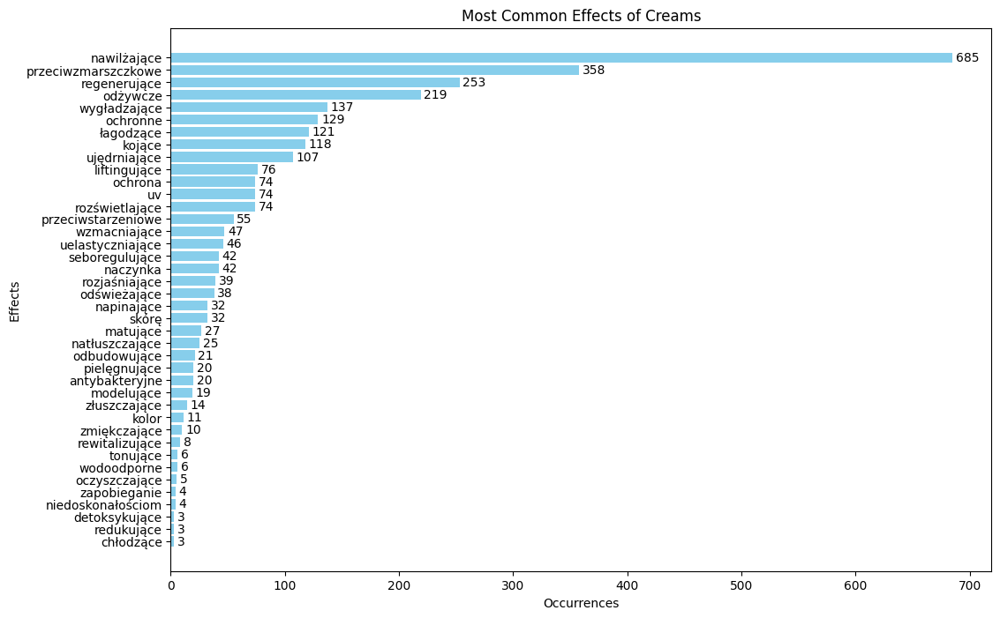

In [ ]:
most_common_words = [('nawilżające', 685), ('przeciwzmarszczkowe', 358), ('regenerujące', 253), ('odżywcze', 219),
        ('wygładzające', 137), ('ochronne', 129), ('łagodzące', 121), ('kojące', 118),
        ('ujędrniające', 107), ('liftingujące', 76), ('ochrona', 74), ('uv', 74),
        ('rozświetlające', 74), ('przeciwstarzeniowe', 55), ('wzmacniające', 47),
        ('uelastyczniające', 46), ('seboregulujące', 42), ('naczynka', 42),
        ('rozjaśniające', 39), ('odświeżające', 38), ('napinające', 32),
        ('skórę', 32), ('matujące', 27), ('natłuszczające', 25), ('odbudowujące', 21),
        ('pielęgnujące', 20), ('antybakteryjne', 20), ('modelujące', 19),
        ('złuszczające', 14), ('kolor', 11), ('zmiękczające', 10),
        ('rewitalizujące', 8), ('tonujące', 6), ('wodoodporne', 6),
        ('oczyszczające', 5), ('zapobieganie', 4), ('niedoskonałościom', 4),
        ('detoksykujące', 3), ('redukujące', 3), ('chłodzące', 3)]

labels, values = zip(*most_common_words)

plt.figure(figsize=(12, 8))
plt.barh(labels, values, color='skyblue')
plt.xlabel('Occurrences')
plt.ylabel('Effects')
plt.title('Most Common Effects of Creams')
plt.gca().invert_yaxis()

for i, v in enumerate(values):
    plt.text(v + 3, i, str(v), color='black', va='center')

plt.show()

In [ ]:
top_40_words = [word for word, count in most_common_words]
top_40_words

In [ ]:
top_40_words = ['nawilżające', 'przeciwzmarszczkowe', 'regenerujące', 'odżywcze', 'wygładzające', 'ochronne',
                'łagodzące', 'kojące', 'ujędrniające', 'liftingujące', 'ochrona', 'uv', 'rozświetlające',
                'przeciwstarzeniowe', 'wzmacniające', 'uelastyczniające', 'seboregulujące', 'naczynka',
                'rozjaśniające', 'odświeżające', 'napinające', 'skórę', 'matujące', 'natłuszczające',
                'odbudowujące', 'pielęgnujące', 'antybakteryjne', 'modelujące', 'złuszczające', 'kolor',
                'zmiękczające', 'rewitalizujące', 'tonujące', 'wodoodporne', 'oczyszczające', 'zapobieganie',
                'niedoskonałościom', 'detoksykujące', 'redukujące', 'chłodzące', 'nawilżający', 'przeciwzmarszczkowy',
                'regenerujący', 'odżywczy', 'wygładzający', 'ochronny', 'łagodzący', 'kojący', 'ujędrniający',
                'liftingujący', 'ochronny', 'uv', 'rozświetlający', 'przeciwstarzeniowy', 'wzmacniający',
                'uelastyczniający', 'seboregulujący', 'rozjaśniający', 'odświeżający', 'napinający', 'matujący',
                'natłuszczający', 'odbudowujący', 'pielęgnujący', 'antybakteryjny', 'modelujący', 'złuszczający',
                'zmiękczający', 'rewitalizujący', 'tonujący', 'wodoodporny', 'oczyszczający', 'niedoskonałościom',
                'detoksykujący', 'redukujący', 'chłodzący']
top_40_words

['nawilżające',
 'przeciwzmarszczkowe',
 'regenerujące',
 'odżywcze',
 'wygładzające',
 'ochronne',
 'łagodzące',
 'kojące',
 'ujędrniające',
 'liftingujące',
 'ochrona',
 'uv',
 'rozświetlające',
 'przeciwstarzeniowe',
 'wzmacniające',
 'uelastyczniające',
 'seboregulujące',
 'naczynka',
 'rozjaśniające',
 'odświeżające',
 'napinające',
 'skórę',
 'matujące',
 'natłuszczające',
 'odbudowujące',
 'pielęgnujące',
 'antybakteryjne',
 'modelujące',
 'złuszczające',
 'kolor',
 'zmiękczające',
 'rewitalizujące',
 'tonujące',
 'wodoodporne',
 'oczyszczające',
 'zapobieganie',
 'niedoskonałościom',
 'detoksykujące',
 'redukujące',
 'chłodzące',
 'nawilżający',
 'przeciwzmarszczkowy',
 'regenerujący',
 'odżywczy',
 'wygładzający',
 'ochronny',
 'łagodzący',
 'kojący',
 'ujędrniający',
 'liftingujący',
 'ochronny',
 'uv',
 'rozświetlający',
 'przeciwstarzeniowy',
 'wzmacniający',
 'uelastyczniający',
 'seboregulujący',
 'rozjaśniający',
 'odświeżający',
 'napinający',
 'matujący',
 'natłuszczaj

# 4. Defining the data cleansing function:

#### Function to change the "count_of_ratings" column from object to int and fill it with zeros where there are no opinions:

In [ ]:
def convert_rating(rating_str):
    try:
        return int(rating_str.strip('()'))
    except (ValueError, AttributeError):
        return pd.NA

def process_count_of_ratings(data):
    data['count_of_ratings'] = data['count_of_ratings'].apply(convert_rating)
    data['count_of_ratings'] = data['count_of_ratings'].fillna(0).astype(int)
    return data

#### Deleting rows with missing values in the "ingredients" column:

In [ ]:
def drop_rows_with_missing_ingredients(df):
    return df.dropna(subset=['ingredients'])

#### Function to extract the product's effect from the description (only those that are in the 'top_40_words' list) where the effects are not given:

In [ ]:
def extract_effect(description):
    pattern = rf"(?i)({'|'.join(top_40_words)})"
    match = re.search(pattern, description)
    return match.group(0) if match else None

In [ ]:
def update_missing_effect(df):
    condition = df['effect'].isna()
    df.loc[condition, 'effect'] = df.loc[condition, 'product_description'].apply(extract_effect)
    return df

#### Update of the 'efefct' column to 'ochrona UV' for products with the phrase 'SPF' in the description:

In [ ]:
def update_effect_for_spf(df):
    df.loc[df['product_description'].str.contains('SPF', case=False, na=False), 'effect'] = 'ochrona UV'
    return df

#### Function to replace the value in the 'effect' column based on the product description:

In [ ]:
def update_effect_from_product_description(data):
    data.loc[data['product_description'].str.contains('niedoskonałość.*', case=False, na=False), 'effect'] = 'przeciw niedoskonałościom'
    data.loc[data['product_description'].str.contains('nawadniając.*', case=False, na=False), 'effect'] = 'nawilżający'
    data.loc[data['product_description'].str.contains('nawilżając.*', case=False, na=False), 'effect'] = 'nawilżający'
    data.loc[data['product_description'].str.contains('odmładzając.*', case=False, na=False), 'effect'] = 'odmładzający'
    data.loc[data['product_description'].str.contains('przeciwzmarszczkow.*', case=False, na=False), 'effect'] = 'przeciwzmarszczkowy'
    data.loc[data['product_description'].str.contains('regenerując.*', case=False, na=False), 'effect'] = 'regenerujący'
    data.loc[data['product_description'].str.contains('wielofunkcyjn.*', case=False, na=False), 'effect'] = 'wielofunkcyjny'
    data.loc[data['product_description'].str.contains('młodoś.*', case=False, na=False), 'effect'] = 'przeciwzmarszczkowy'
    data.loc[data['product_description'].str.contains('odżywcz.*', case=False, na=False), 'effect'] = 'odżywczy'
    data.loc[data['product_description'].str.contains('ujędrniając.*', case=False, na=False), 'effect'] = 'ujędrniający'
    return data

#### Function to remove the 'unit price' column (I noticed that it was downloaded incorrectly from the website. I will insert it through calculations at a later stage):

In [ ]:
def drop_unit_price_column(df):
    return df.drop('unit_price', axis=1)

#### Removing rows with missing values in the "effect" column:

In [ ]:
def drop_rows_with_missing_effect(df):
    return df.dropna(subset=['effect'])

#### Function to extract product capacity based on description (I use an expression to find a string of digits at the beginning or end of the string). I create a new 'capacity' column and fill it with data from the extract_capacity function:

In [ ]:
def extract_capacity(description):
    match = re.search(r'\d+\s*(ml|g)', description, re.IGNORECASE)
    if match:
        capacity_with_unit = match.group()
        capacity = re.sub(r'\s*(ml|g)', '', capacity_with_unit, flags=re.IGNORECASE)
        return int(capacity)
    else:
        return None

def add_capacity_column(df):
    df = df.assign(capacity=df['product_description'].apply(extract_capacity))
    return df

#### Function to remove products without specified capacity:


In [ ]:
def drop_rows_with_missing_capacity(df):
    return df.dropna(subset=['capacity'])

#### Function for unit price per 100ml for regular price and unit price per 100ml for promotional price:

In [ ]:
def add_unit_price_columns(df):
    df['regular_unit_price_100ml'] = ((df['regular_price'] / df['capacity']) * 100).round(2)
    df['promotion_unit_price_100ml'] = ((df['product_price'] / df['capacity']) * 100).round(2)
    return df

#### Function to assign a brand based on the column content:

In [ ]:
def assign_brand(product_name):
    for brand in brand_list:
        if brand in product_name:
            return brand
    return 'Other'

def add_brand_column(df):
    df = df.assign(brand=df['product_name'].apply(assign_brand))
    return df

#### We remove products that have less than 5 in the 'count_of_ratings' column (number of ratings):

In [ ]:
def drop_low_rating_products(df):
    df = df[df['count_of_ratings'] >= 5]
    return df

#### Function to remove products with a price higher than the 99th price percentile:

In [ ]:
class OutlierRemoverByPrice(TransformerMixin):
    def __init__(self, percentile_99=99):
        self.percentile_99 = percentile_99
        self.price_percentile = None

    def fit(self, X, y=None):
        self.price_percentile = X['regular_price'].quantile(self.percentile_99 / 100.0)
        return self

    def transform(self, X, y=None):
        mask = X['regular_price'] <= self.price_percentile
        return X[mask].copy()

#### Function to calculate relative discount:



In [ ]:
def calculate_discount(data):
    data['discount'] = ((data['regular_price'] - data['product_price']) / data['regular_price'] * 100)
    return data

def add_discount_column(df):
    df = df.apply(calculate_discount, axis=1)
    return df

# 5. I create a pipeline for the training set:

In [ ]:
pipeline_train = Pipeline([
    ('count_of_ratings_processing', FunctionTransformer(process_count_of_ratings)),
    ('drop_missing_ingredients', FunctionTransformer(drop_rows_with_missing_ingredients)),
    ('update_missing_effect', FunctionTransformer(update_missing_effect)),
    ('add_capacity_column', FunctionTransformer(add_capacity_column)),
    ('update_effect_for_spf', FunctionTransformer(update_effect_for_spf)),
    ('update_effect_from_product_description', FunctionTransformer(update_effect_from_product_description)),
    ('drop_unit_price_column', FunctionTransformer(drop_unit_price_column)),
    ('drop_missing_effect', FunctionTransformer(drop_rows_with_missing_effect)),
    ('drop_missing_capacity', FunctionTransformer(drop_rows_with_missing_capacity)),
    ('add_unit_price_columns', FunctionTransformer(add_unit_price_columns)),
    ('assign_brand', FunctionTransformer(add_brand_column)),
    ('drop_low_rating_products', FunctionTransformer(drop_low_rating_products)),
    ('remove_outliers_by_price', OutlierRemoverByPrice()),
    ('add_discount', FunctionTransformer(add_discount_column)),
])

In [ ]:
train_data_hebe_transformed = pipeline_train.fit_transform(train_data_hebe)

In [ ]:
train_data_hebe_transformed

In [ ]:
train_data_hebe_transformed.isna().sum()

product_name                  0
product_description           0
count_of_ratings              0
product_price                 0
regular_price                 0
product_url                   0
effect                        0
ingredients                   0
rating                        0
capacity                      0
regular_unit_price_100ml      0
promotion_unit_price_100ml    0
brand                         0
discount                      0
dtype: int64

In [ ]:
train_data_hebe_transformed.describe()

,count_of_ratings,product_price,regular_price,rating,capacity,regular_unit_price_100ml,promotion_unit_price_100ml,discount
count,592.000000,592.000000,592.000000,592.000000,592.000000,592.000000,592.000000,592.000000
mean,32.744932,52.677044,59.707466,4.517230,57.020270,125.829747,110.120828,11.895792
std,90.737684,36.694344,39.178010,0.491664,40.422677,97.150439,86.079337,15.511126
min,5.000000,6.990000,6.990000,1.900000,7.000000,5.400000,5.400000,0.000000
25%,7.000000,24.490000,31.990000,4.300000,50.000000,54.985000,47.980000,0.000000
50%,11.000000,39.990000,49.990000,4.700000,50.000000,99.980000,82.375000,0.000000
75%,24.000000,69.990000,75.490000,4.900000,50.000000,159.980000,142.605000,29.872815
max,1203.000000,189.990000,189.990000,5.000000,500.000000,933.270000,599.930000,71.433674


In [ ]:
train_data_hebe_transformed.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 592 entries, 4 to 1882
Data columns (total 14 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   product_name                592 non-null    object 
 1   product_description         592 non-null    object 
 2   count_of_ratings            592 non-null    int64  
 3   product_price               592 non-null    float64
 4   regular_price               592 non-null    float64
 5   product_url                 592 non-null    object 
 6   effect                      592 non-null    object 
 7   ingredients                 592 non-null    object 
 8   rating                      592 non-null    float64
 9   capacity                    592 non-null    float64
 10  regular_unit_price_100ml    592 non-null    float64
 11  promotion_unit_price_100ml  592 non-null    float64
 12  brand                       592 non-null    object 
 13  discount                    592 no

# 6. Relationship between regular price and product rating:

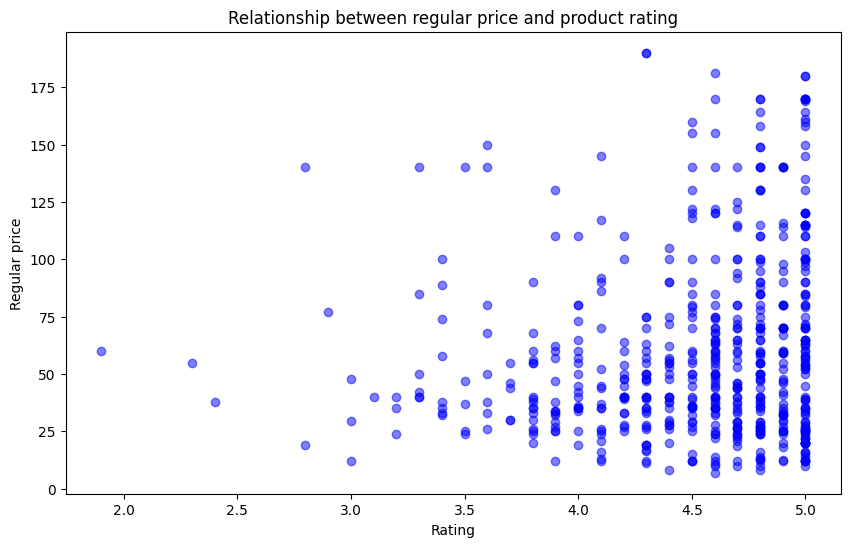

In [ ]:
rating = train_data_hebe_transformed['rating']
regular_price = train_data_hebe_transformed['regular_price']

plt.figure(figsize=(10, 6))
plt.scatter(rating, regular_price, color='b', alpha=0.5)

plt.title('Relationship between regular price and product rating')
plt.ylabel('Regular price')
plt.xlabel('Rating')

plt.show()

# 7. Visualize the differences between brands in terms of number of ratings, average rating and average price. It helps to see which brands are more popular and have better ratings among users:

<ipython-input-138-0003eaf84c4c>:30: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(sm, label = "average rating")


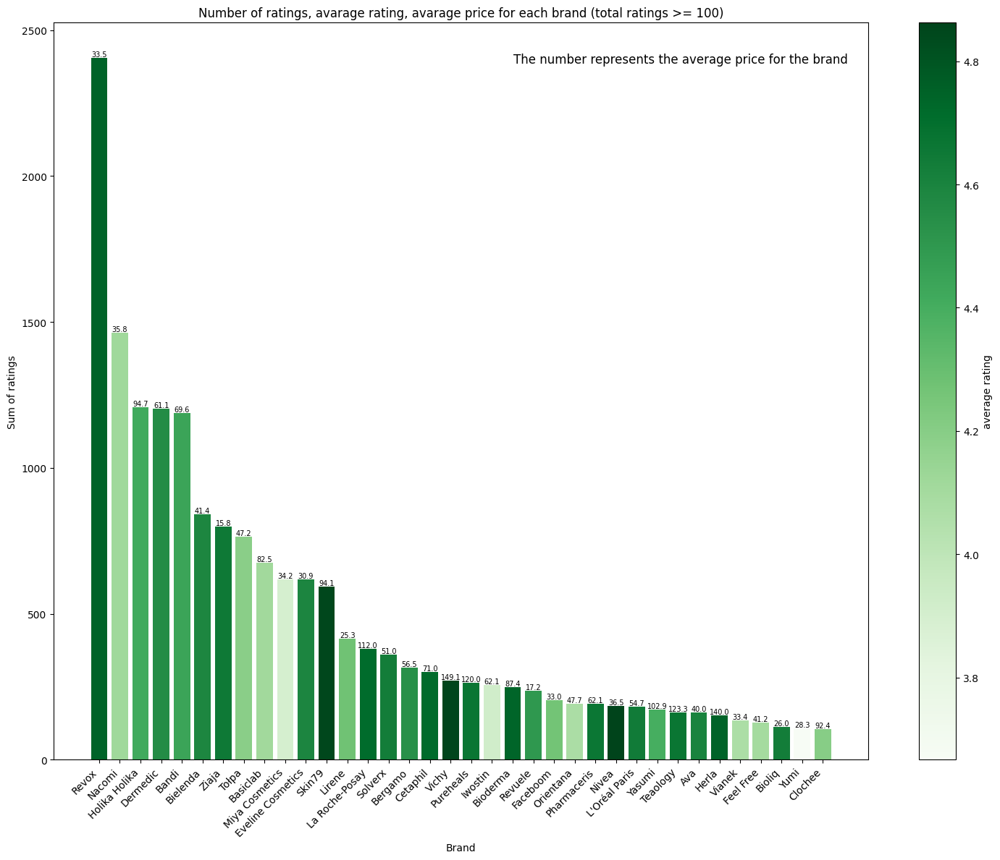

In [ ]:
plt.figure(figsize=(15, 12))

brand_ratings = train_data_hebe_transformed.groupby('brand').agg({'count_of_ratings': 'sum', 'rating': 'mean','regular_price': 'mean' }).reset_index()
brand_ratings = brand_ratings[brand_ratings['count_of_ratings'] >= 100]
brand_ratings = brand_ratings.sort_values(by='count_of_ratings', ascending=False)

colors = plt.cm.Greens(mcolors.Normalize(vmin=brand_ratings['rating'].min(), vmax=brand_ratings['rating'].max())(brand_ratings['rating']))
bars = plt.bar(x=brand_ratings['brand'], height=brand_ratings['count_of_ratings'], color=colors)

for bar, rating, count, price in zip(bars, brand_ratings['rating'], brand_ratings['count_of_ratings'], brand_ratings['regular_price']):
    bar.set_label(f"Suma ocen: {int(count)}\nŚrednia ocena: {rating:.1f}\nŚrednia cena: {price:.1f}")
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), f"{price:.1f}",
             ha='center', va='bottom', fontsize=7, color='black')

plt.xlabel('Brand')
plt.ylabel('Sum of ratings')
plt.title('Number of ratings, avarage rating, avarage price for each brand (total ratings >= 100)')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()

sm = plt.cm.ScalarMappable(cmap='Greens', norm=plt.Normalize(vmin=brand_ratings['rating'].min(), vmax=brand_ratings['rating'].max()))
sm.set_array([])
plt.colorbar(sm, label = "average rating")

plt.text(0.77, 0.95, 'The number represents the average price for the brand', horizontalalignment='center', verticalalignment='center', transform=plt.gca().transAxes, fontsize=12)


plt.show()

# 8. I present the relationships between average discounts and average ratings of cosmetic brands. It helps to see which brands offer products with higher average discounts and user ratings (select only products with ratings greater than 50 and discount greater than zero):

<ipython-input-118-d6ff9ba5a707>:32: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(sm)


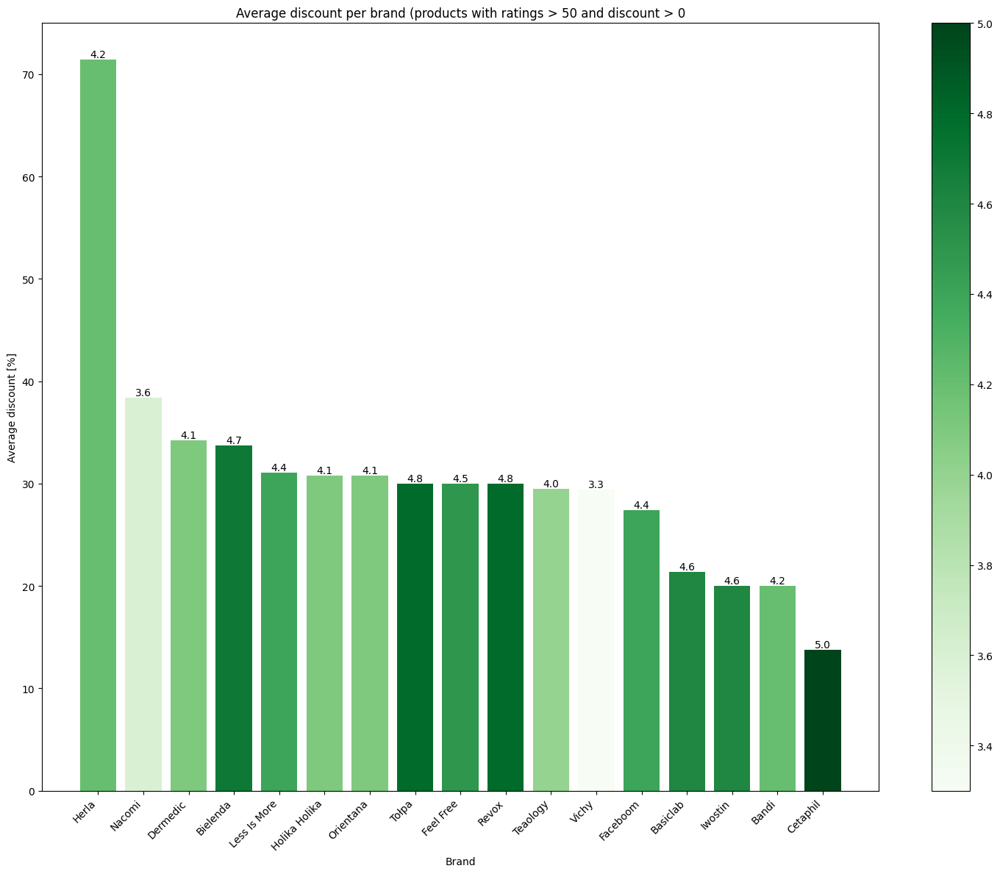

In [ ]:
popular_products = train_data_hebe_transformed[(train_data_hebe_transformed['count_of_ratings'] > 50) & (train_data_hebe_transformed['discount'] > 0)]

brand_avg_discount = popular_products.groupby('brand')['discount'].mean().round(1).reset_index()
brand_avg_rating = popular_products.groupby('brand')['rating'].mean().round(1).reset_index()
brand_avg_discount = brand_avg_discount.sort_values(by='discount', ascending=False)

plt.figure(figsize=(15, 12))

colors = plt.cm.Greens(mcolors.Normalize(vmin=brand_avg_rating['rating'].min(), vmax=brand_avg_rating['rating'].max())(brand_avg_rating['rating']))

bars = plt.bar(x=brand_avg_discount['brand'], height=brand_avg_discount['discount'], color=colors)

for bar, rating in zip(bars, brand_avg_rating['rating']):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), f'{rating}', ha='center', va='bottom', fontsize=10)

plt.ylim(plt.ylim()[0], plt.ylim()[1] + 0.02)

plt.ylabel('Average discount [%]')
plt.xlabel('Brand')
plt.title('Average discount per brand (products with ratings > 50 and discount > 0')

plt.xticks(rotation=45, ha='right')
plt.tight_layout()

sm = plt.cm.ScalarMappable(cmap='Greens', norm=plt.Normalize(vmin=brand_avg_rating['rating'].min(), vmax=brand_avg_rating['rating'].max()))
sm.set_array([])
plt.colorbar(sm)

plt.show()


# 9. Operations aimed at processing data regarding cosmetic ingredients (lemmatizing components, removing spaces in parentheses, mapping different forms to a uniform form and converting text to lowercase and removing certain special characters):

In [ ]:
nlp = spacy.load('en_core_web_sm')

def lemmatize_ingredients(ingredients_list):
    lemmatized_ingredients = []

    for ingredient in ingredients_list:
        doc = nlp(ingredient)
        lemmatized_ingredient = " ".join([token.lemma_ for token in doc])
        lemmatized_ingredients.append(lemmatized_ingredient)

    return lemmatized_ingredients

In [ ]:
def remove_spaces_inside_parentheses(text):
    matches = re.findall(r'\([^()]*\)', text)
    for match in matches:
        text = text.replace(match, match.replace(' ', ''))
    return text

In [ ]:
mapping_dict = {
    'aqua': 'water',
    'aqu': 'water',
    'aqua*': 'water',
    'ingredients/(inci): aqua*': 'water',
    'ingredients: aqua': 'water',
    'aqua/water/eau': 'water',
    'aqua/water/ea': 'water',
    'water/aqua/eau': 'water',
    'aqua (water)': 'water',
    'water / aqua': 'water',
    'aqua (woda)': 'water',
    'water': 'water',
    'eau': 'water',
    'aqua/water': 'water',
    'water (aqua)': 'water',
    'aqua/water (swiss glacier water)': 'water',
    'inci: aqua/ water': 'water',
    'aqua (*)': 'water',
    'skład/inci: aqua': 'water',
    'ingredients/składniki (inci): aqua': 'water',
    'aqua /water / eau': 'water',
    'tlenek żelaza\ninci: aqua': 'water',
    'maris aqua': 'water',
    'aqua ‹woda›': 'water',
    'aquawater': 'water',
    'aqua water': 'water',
    'inci aqua water': 'water',
    'skład inci aqua': 'water',
    'aqua water eau': 'water',
    '[aqua (water)*': 'water',
    'aqua (water)': 'water',
    'aqua,water,': 'water,',
    'Aqua/Water': 'water',
    'Aqua': 'water',
    'Aqua (Water)': 'water',

}

def map_to_water(ingredient):
    if 'aqua' in ingredient.lower():
        ingredient = ingredient.replace('aqua', 'water')
        ingredient = ingredient.replace('*', '').replace('(', '').replace(')', '')
    return mapping_dict.get(ingredient.lower(), ingredient)

In [ ]:
def process_water_text(text):
    water_occurrences = text.count('water')
    if water_occurrences > 1:
        first_water_index = text.find('water')
        text = text[:first_water_index] + text[first_water_index + 5:].replace('water', '')
        text = text.replace('*', '').replace('(', '').replace(')', '')
    return text

In [ ]:
def lowercase_and_remove_special_chars(text):
    text = text.replace(' • ', ',')
    text = text.lower()
    text = text.replace(' / ', ',').replace(' [', ',').replace('] ', ',')
    text = text.replace(' ,', ',').replace(' .', '.').replace(' :', ':').replace(' !', '!')
    text = text.strip()
    return text

In [ ]:
df=train_data_hebe_transformed

df['lemmatized_ingredients'] = df['ingredients'].apply(lambda x: lemmatize_ingredients([item.replace('), ', ')') for item in x.split(", ")]))
df['lemmatized_ingredients'] = df['lemmatized_ingredients'].apply(lambda x: [remove_spaces_inside_parentheses(ingredient) for ingredient in x])

In [ ]:
df['lemmatized_ingredients'] = df['lemmatized_ingredients'].apply(lambda x: [ingredient.replace('aqua', 'water') for ingredient in x])

In [ ]:
df['lemmatized_ingredients'] = df['lemmatized_ingredients'].apply(lambda x: [lowercase_and_remove_special_chars(ingredient) for ingredient in x])

In [ ]:
df['lemmatized_ingredients'] = df['lemmatized_ingredients'].apply(lambda x: [ingredient.replace('aqua', 'water') for ingredient in x])

In [ ]:
df

In [ ]:
df['lemmatized_ingredients'] = df['lemmatized_ingredients'].apply(lambda x: ', '.join(x))
df

#### Control dataframe saving:

In [ ]:
drive.mount('/content/drive')
csv_path = '/content/drive/MyDrive/hebe_cosmetics_project/train_data_without_aqua.csv'

df.to_csv(csv_path, index=False)

print("The CSV file has been saved to Google Drive.")

In [ ]:
drive.mount('/content/drive')

df_new= pd.read_csv('/content/drive/MyDrive/hebe_cosmetics_project/train_data_without_aqua.csv')
with pd.option_context('display.max_columns', None):
    display(df_new)

#### Displaying products that have no water in the column "lemmatized_ingredients" and further processing of the 'lemmatized ingredients' column:

In [ ]:
products_without_water = df_new[df_new['lemmatized_ingredients'].str.contains(r'\bwater\b', case=False, na=False) == False]
products_without_water

In [ ]:
def clean_ingredients(text):
    text = re.sub(r',+', ',', text)
    text = re.sub(r'[\n:;/-]', ',', text)
    text = text.replace('*', '')
    text = text.strip(',')
    text = re.sub(r',([^ ])', r', \1', text)
    return text

df_new['lemmatized_ingredients'] = df_new['lemmatized_ingredients'].apply(clean_ingredients)

#### Transforming the list of ingredients in the 'lemmatized_ingredients' column, counting the number of times each ingredient appears, removing those that appear only once and finally recombines the ingredients:

In [ ]:
df_new['lemmatized_ingredients'] = df_new['lemmatized_ingredients'].str.split(', ')

ingredient_counts = {}

for ingredients_list in df_new['lemmatized_ingredients']:
    for ingredient in ingredients_list:
        ingredient_counts[ingredient] = ingredient_counts.get(ingredient, 0) + 1

single_occurrence_ingredients = [ingredient for ingredient, count in ingredient_counts.items() if count == 1]

def remove_single_occurrence_ingredients(ingredients_list):
    return [ingredient for ingredient in ingredients_list if ingredient not in single_occurrence_ingredients]

df_new['lemmatized_ingredients'] = df_new['lemmatized_ingredients'].apply(remove_single_occurrence_ingredients)
df_new['lemmatized_ingredients'] = df_new['lemmatized_ingredients'].str.join(', ')

In [ ]:
single_occurrence_ingredients

['cynara scolymus leaf extract',
 '5 peg',
 '5 dimethicone',
 'methoxy peg',
 '25',
 '4 dimethicone',
 'cucurbitaceae (gourd) extract',
 'pyrus malus (apple) juice',
 'triticum vulgare (wheat) seed extract',
 'hordeum vulgare seed extract',
 'lactococcus ferment extract',
 'brassica nigra seed ferment extract',
 'glyceryl undecylenate dilinoleic acid',
 'benzotriazolyl tetramethylbutylphenol (nano) ',
 'dicaprylyl ether ',
 'diethylamino hydroxybenzoyl hexyl benzoate ',
 'biphenyl triazine (nano) ',
 'decyl glucoside ',
 'glycine soja oil ',
 'resveratrol ',
 'hydroxypropyl cyclodextrin ',
 'cyclodextrin ',
 'polydextrose ',
 'carnitine ',
 'ubiquinone ',
 'pvp crosspolymer ',
 'disodium phosphate ',
 'trisodium edta ',
 'parfum (fragrance) ',
 'methylsilanol hydroxyproline aspartate',
 'himanthalia elongata extract',
 'citric acid. podana lista składników jest zgodna z aktualnym stanem wytwarzania na 2020 ',
 'ethylene',
 'propylene',
 'styrene copolymer',
 'sclerocarya birrea kernel 

#### Defining keywords related to cosmetics in English and Polish to eliminate Polish ingredients:

In [ ]:
english_keywords = ['water', 'acid', 'extract', 'oil', 'glycerin']
polish_keywords = ['woda', 'kwas', 'ekstrakt', 'olej', 'gliceryna']

def detect_language(text):
    english_count = sum(1 for keyword in english_keywords if keyword in text.lower())
    polish_count = sum(1 for keyword in polish_keywords if keyword in text.lower())
    if english_count > polish_count:
        return 'English'
    elif english_count < polish_count:
        return 'Polish'
    else:
        return 'Unknown'

df_new['language'] = df_new['ingredients'].apply(detect_language)

english_products_count = len(df_new[df_new['language'] == 'English'])
polish_products_count = len(df_new[df_new['language'] == 'Polish'])
unknown_language_products_count = len(df_new[df_new['language'] == 'Unknown'])

print(f'Number of products in English: {english_products_count}')
print(f'Number of products in Polish: {polish_products_count}')
print(f'Number of products unknown: {unknown_language_products_count}')

Number of products in English: 571
Number of products in Polish: 9
Number of products unknown: 12


In [ ]:
polish_and_unknown_products = df_new[df_new['language'].isin(['Polish', 'Unknown'])]
polish_and_unknown_products

#### Removal of products with Polish and unknown ingredients:

In [ ]:
df_new = df_new[df_new['language'].isin(['English'])]
df_new = df_new.reset_index(drop=True)

#### I remove products without the word "water" in the lemmatized ingredients column:

In [ ]:
products_without_water = df_new[(df_new['lemmatized_ingredients'].str.contains(r'\bwater\b', case=False, na=False) == False) & (~df_new['ingredients'].str.contains('AQUA', case=False, na=False))]
products_without_water

In [ ]:
products_without_water.count()

product_name                  9
product_description           9
count_of_ratings              9
product_price                 9
regular_price                 9
product_url                   9
effect                        9
ingredients                   9
rating                        9
capacity                      9
regular_unit_price_100ml      9
promotion_unit_price_100ml    9
brand                         9
discount                      9
lemmatized_ingredients        9
language                      9
dtype: int64

In [ ]:
df_new = df_new[~df_new.index.isin(products_without_water.index)]
df_new = df_new.reset_index(drop=True)
df_new

#### All products already contain "water" in ingredients, so I will remove this ingredient because it doesn't add anything specific to analysis:

In [ ]:
def remove_water_info(text):
    pattern = r'water[^\,]*\,'

    return re.sub(pattern, '', text)
df_new['lemmatized_ingredients'] = df_new['lemmatized_ingredients'].apply(remove_water_info)

In [ ]:
df_new.isnull().sum()

product_name                  0
product_description           0
count_of_ratings              0
product_price                 0
regular_price                 0
product_url                   0
effect                        0
ingredients                   0
rating                        0
capacity                      0
regular_unit_price_100ml      0
promotion_unit_price_100ml    0
brand                         0
discount                      0
lemmatized_ingredients        0
language                      0
dtype: int64

In [ ]:
drive.mount('/content/drive')
csv_path = '/content/drive/MyDrive/hebe_cosmetics_project/train_data_without_any_water.csv'
df_new.to_csv(csv_path, index=False)
print("Plik CSV został zapisany na Google Drive.")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Plik CSV został zapisany na Google Drive.


In [ ]:
drive.mount('/content/drive')
df_without_water= pd.read_csv('/content/drive/MyDrive/hebe_cosmetics_project/train_data_without_any_water.csv')
with pd.option_context('display.max_columns', None):
    display(df_without_water)

#### Additives identifies the quantity of products that have missing ingredients (NaN) in the 'lemmatized_ingredients' column:

In [ ]:
df = df_without_water
products_with_nan = df[df['lemmatized_ingredients'].isna()]
products_with_nan.shape[0]

2

In [ ]:
df = df.dropna(subset=['lemmatized_ingredients'])
df = df.reset_index(drop=True)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 560 entries, 0 to 559
Data columns (total 16 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   product_name                560 non-null    object 
 1   product_description         560 non-null    object 
 2   count_of_ratings            560 non-null    int64  
 3   product_price               560 non-null    float64
 4   regular_price               560 non-null    float64
 5   product_url                 560 non-null    object 
 6   effect                      560 non-null    object 
 7   ingredients                 560 non-null    object 
 8   rating                      560 non-null    float64
 9   capacity                    560 non-null    float64
 10  regular_unit_price_100ml    560 non-null    float64
 11  promotion_unit_price_100ml  560 non-null    float64
 12  brand                       560 non-null    object 
 13  discount                    560 non

# 10. Predicting the rating of cosmetics based on their ingredients:

#### Preparing data for TF-IDF analysis:

In [ ]:
tfidf_vectorizer = TfidfVectorizer(token_pattern=r'[a-zA-Z]{2,}(?=\,)', preprocessor=None)
tfidf_matrix = tfidf_vectorizer.fit_transform(df['lemmatized_ingredients'])

scaler = StandardScaler()
tfidf_matrix_std = scaler.fit_transform(tfidf_matrix.toarray())

kf = KFold(n_splits=5, shuffle=True, random_state=42)

predicted_ratings = cross_val_predict(estimator=KNeighborsRegressor(), X=tfidf_matrix_std, y=df['rating'], cv=kf)
df['predicted_rating'] = predicted_ratings

print(df[['product_name', 'rating', 'predicted_rating']])

mae = mean_absolute_error(df['rating'], df['predicted_rating'])
print(f"Mean Absolute Error (MAE): {mae}")

                      product_name  rating  predicted_rating
0                  Dermedic Oilage     4.9              4.18
1                 Bandi Well Aging     5.0              4.62
2                Eveline Cosmetics     4.3              4.68
3    Ziaja Baltic Home Spa Welness     5.0              4.22
4                 Bandi Hydro Care     4.5              4.48
..                             ...     ...               ...
555    Miya Cosmetics MyWonderBalm     3.4              4.08
556          Facemania Snail Slime     4.2              4.18
557                   Skin79 Magic     5.0              4.64
558           Ava Botanical Hitech     4.7              4.14
559  Eveline Cosmetics Beauty&Glow     3.9              4.10

[560 rows x 3 columns]
Mean Absolute Error (MAE): 0.4140357142857143


In [ ]:
average_rating = df['rating'].mean()

average_predicted_rating = df['predicted_rating'].mean()

rating_difference = abs(average_predicted_rating - average_rating)

print(f"Average actual rating: {average_rating}")
print(f"Average predicted rating: {average_predicted_rating}")
print(f"The difference between the predicted and actual average rating: {rating_difference}")

Average actual rating: 4.508035714285715
Average predicted rating: 4.3934999999999995
The difference between the predicted and actual average rating: 0.11453571428571507


Conclusion: The difference between predicted and actual ratings is on average 0.11. This suggests that the model may not be useful.


# 11. Predicting the product price based on the impact of individual ingredients on the final price:

In [ ]:
top_ingredients_lower

['aloe',
 'bakuchiol',
 'ceramide',
 'coenzyme q10',
 'ubiquinone',
 'ubiquinol',
 'ubidecarenone',
 'collagen',
 'konopihemp',
 'phytic acid',
 'azelaic acid',
 'glycolic acid',
 'hyaluronic acid',
 'sodium hyaluronate',
 'hydrolyzed hyaluronic acid',
 'hyaluronan',
 'sodium acetylated hyaluronate',
 'lactobionic acid',
 'lactic acid',
 'mandelic acid',
 'salicylic acid',
 'niacinamide',
 'argan oil',
 'argania spinosa kernel oil',
 'gan oil',
 'avocado oil',
 'persea gratissima oil',
 'jojoba oil',
 'simmondsia chinensis seed oil',
 'coconut oil',
 'olej kokosowy',
 'cocos nucifera',
 'castor oil',
 'tamanu',
 'black cumin oil',
 'nigella sativa seed oil',
 'nigella sativa',
 'prunus amygdalus dulcis oil',
 ' rubus idaeus seed oil',
 'rubus idaeus',
 'peptide',
 'tripeptide',
 'tetrapeptide',
 'hexapeptide',
 'propolis',
 'retinol',
 'retinyl',
 'squalan',
 'squalane',
 'snail secretion filtrate',
 'ascorbyl tetraisopalmitate',
 'ascorbic acid',
 'sodium ascorbyl phosphate',
 'centel

#### I am checking if any of the ingredients from the top_ingredients_lower list are in the list of lemmatized ingredients:

In [ ]:
filtered_products = df[df['lemmatized_ingredients'].apply(lambda x: any(ingredient in x for ingredient in top_ingredients_lower))]
filtered_products

#### I am presenting the number of products containing individual ingredients:

<ipython-input-22-d49a43d31eb0>:29: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(sm, label="Average rating")


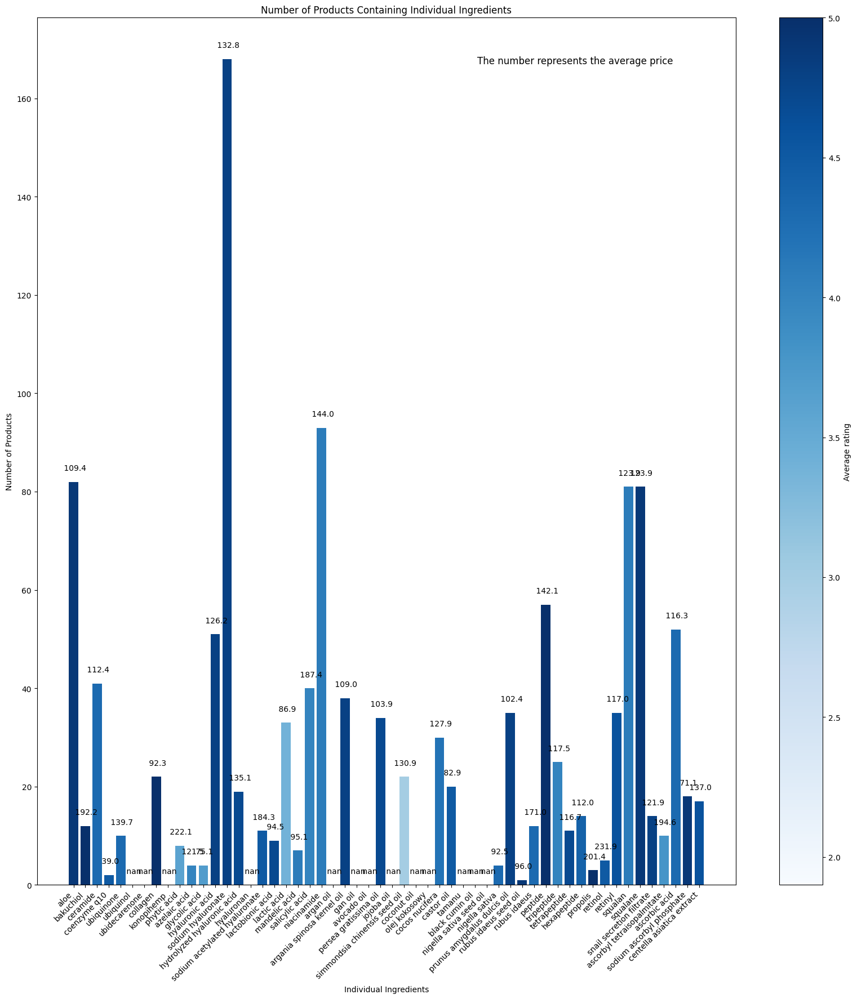

In [ ]:
ingredient_count = {}
for ingredient in top_ingredients_lower:
    count = len(filtered_products[filtered_products['lemmatized_ingredients'].str.contains(ingredient)])
    ingredient_count[ingredient] = count

plt.figure(figsize=(20, 20))
colors = plt.cm.Blues(mcolors.Normalize(vmin=filtered_products['rating'].min(), vmax=filtered_products['rating'].max())(filtered_products['rating']))


avg_prices = []
for i, (ingredient, count) in enumerate(ingredient_count.items()):
    products_with_ingredient = filtered_products[filtered_products['lemmatized_ingredients'].str.contains(ingredient)]
    avg_rating = products_with_ingredient['rating'].mean()

    avg_price_per_100ml = products_with_ingredient['regular_unit_price_100ml'].mean()
    avg_prices.append(avg_price_per_100ml)

    bar = plt.bar(ingredient, count, color=colors[i])
    plt.text(i, count + 2, f' {avg_price_per_100ml:.1f}', ha='center', va='bottom', color='black', fontsize=10)
    bar[0].set_label(f"Average rating: {avg_rating:.1f}")

plt.xlabel('Individual Ingredients')
plt.ylabel('Number of Products')
plt.title('Number of Products Containing Individual Ingredients')
plt.xticks(rotation=45, ha="right")

sm = plt.cm.ScalarMappable(cmap='Blues', norm=plt.Normalize(vmin=filtered_products['rating'].min(), vmax=filtered_products['rating'].max()))
sm.set_array([])
plt.colorbar(sm, label="Average rating")

plt.text(0.77, 0.95, 'The number represents the average price', horizontalalignment='center', verticalalignment='center', transform=plt.gca().transAxes, fontsize=12)

plt.show()

#### Presenting the same in table version:

In [ ]:
ingredient_info = []

for ingredient, count in ingredient_count.items():
    products_with_ingredient = filtered_products[filtered_products['lemmatized_ingredients'].str.contains(ingredient)]

    avg_rating = products_with_ingredient['rating'].mean()
    avg_price_per_100ml = products_with_ingredient['regular_unit_price_100ml'].mean()

    ingredient_info.append({
        'ingredient': ingredient,
        'count': count,
        'avg_rating': avg_rating,
        'avg_price_per_100ml': avg_price_per_100ml
    })

ingredient_df = pd.DataFrame(ingredient_info)
ingredient_df

,ingredient,count,avg_rating,avg_price_per_100ml
0,aloe,82,4.369512,109.430488
1,bakuchiol,12,4.433333,192.200000
2,ceramide,41,4.646341,112.437317
3,coenzyme q10,2,4.450000,38.970000
4,ubiquinone,10,4.720000,139.655000
5,ubiquinol,0,NaN,NaN
6,ubidecarenone,0,NaN,NaN
7,collagen,22,4.686364,92.277727
8,konopihemp,0,NaN,NaN
9,phytic acid,8,4.450000,222.142500


## I am preparing TF-IDF data based on selected ingredients, standardizes them and then performs performance evaluation of various regression models, selecting the best model based on the lowest Mean Absolute Percentage Error (MAPE).

In [ ]:
tfidf_vectorizer = TfidfVectorizer(token_pattern=r'[a-z]{2,}(?=\,|$)', preprocessor=None)
tfidf_matrix = tfidf_vectorizer.fit_transform(filtered_products['lemmatized_ingredients'])

scaler = StandardScaler()
tfidf_matrix_std = scaler.fit_transform(tfidf_matrix.toarray())

X = tfidf_matrix_std
y = filtered_products['regular_unit_price_100ml']

kf = KFold(n_splits=5, shuffle=True, random_state=42)

def find_best_model_params(model, param_grid):
    grid_search = GridSearchCV(model, param_grid, cv=kf, scoring='neg_mean_absolute_percentage_error')
    grid_search.fit(X, y)
    return grid_search.best_params_, grid_search.best_estimator_

models = {
    'Linear Regression': {
        'model': LinearRegression(),
        'param_grid': {},
    },
    'Ridge': {
        'model': Ridge(),
        'param_grid': {'alpha': [0.1, 1.0, 10.0]},
    },
    'Lasso': {
        'model': Lasso(),
        'param_grid': {'alpha': [0.1, 1.0, 10.0]},
    },
    'Random Forest Regressor': {
        'model': RandomForestRegressor(),
        'param_grid': {
            'n_estimators': [50, 100, 200],
            'max_depth': [None, 5, 10],
            'min_samples_split': [2, 5, 10],
            'min_samples_leaf': [1, 2, 4],
        },
    },
    'SVR': {
        'model': SVR(),
        'param_grid': {'C': [0.1, 1.0, 10.0, 20.0], 'kernel': ['linear', 'rbf']},
    },
    'XGBoost': {
        'model': XGBRegressor(),
        'param_grid': {'learning_rate': [0.01, 0.1, 0.3], 'max_depth': [3, 5, 7]},
    },
    'Gradient Boosting Regressor': {
        'model': GradientBoostingRegressor(),
        'param_grid': {
            'n_estimators': [50, 100, 200],
            'learning_rate': [0.01, 0.1, 0.2],
            'max_depth': [3, 5, 7],
        },
    },
}

best_models = {}


for model_name, model_params in models.items():
    model = model_params['model']
    param_grid = model_params['param_grid']

    best_params, best_model = find_best_model_params(model, param_grid)
    best_models[model_name] = {
        'best_params': best_params,
        'model': best_model,
    }

    print(f"Model: {model_name}")
    print(f"Najlepsze parametry: {best_params}")

    y_pred = best_model.predict(X)

    mape = mean_absolute_percentage_error(y, y_pred)
    print(f"Mean Absolute Percentage Error (MAPE): {mape}")
    print("\n")

best_model_name = min(best_models, key=lambda k: mean_absolute_percentage_error(y, best_models[k]['model'].predict(X)))
best_model = best_models[best_model_name]['model']
print(f"The best model: {best_model_name}")


Model: Linear Regression
Najlepsze parametry: {}
Mean Absolute Percentage Error (MAPE): 0.12009291727287444


Model: Ridge
Najlepsze parametry: {'alpha': 10.0}
Mean Absolute Percentage Error (MAPE): 0.22350795669990908




/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.900e+02, tolerance: 3.376e+02
  model = cd_fast.enet_coordinate_descent(


Model: Lasso
Najlepsze parametry: {'alpha': 1.0}
Mean Absolute Percentage Error (MAPE): 0.3403536326508723


Model: Random Forest Regressor
Najlepsze parametry: {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
Mean Absolute Percentage Error (MAPE): 0.2576304405746245


Model: SVR
Najlepsze parametry: {'C': 0.1, 'kernel': 'linear'}
Mean Absolute Percentage Error (MAPE): 0.3168869191443153


Model: XGBoost
Najlepsze parametry: {'learning_rate': 0.1, 'max_depth': 7}
Mean Absolute Percentage Error (MAPE): 0.18047195148304984


Model: Gradient Boosting Regressor
Najlepsze parametry: {'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 200}
Mean Absolute Percentage Error (MAPE): 0.013089106798396052


The best model: Gradient Boosting Regressor


#### Comparison of models and presentation of results:

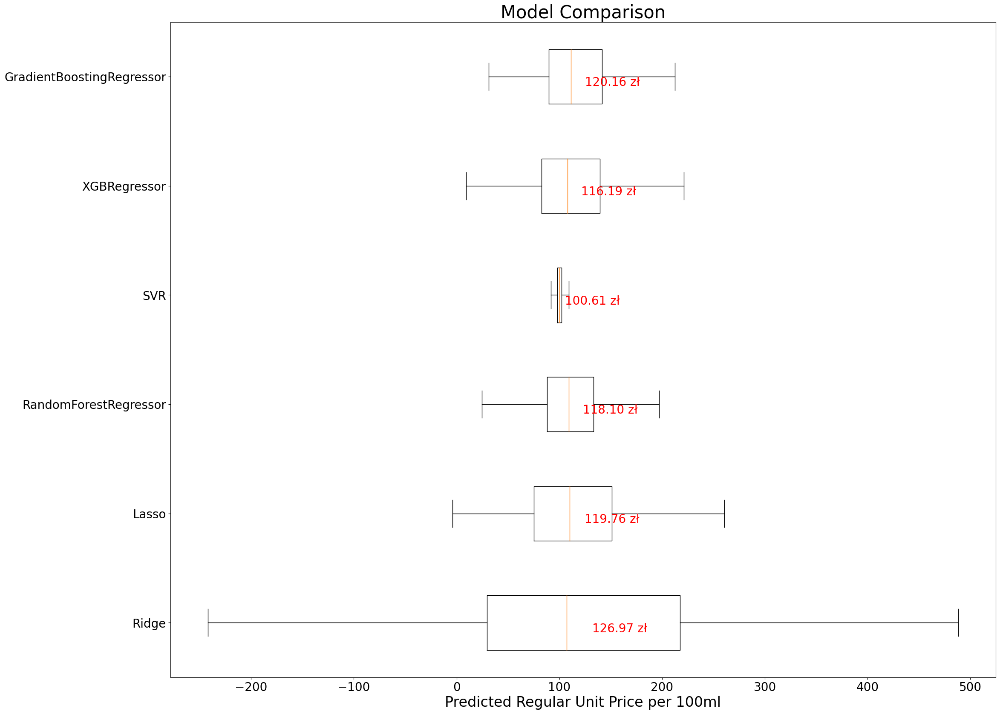

In [ ]:
models_to_compare = [Ridge(), Lasso(), RandomForestRegressor(), SVR(), XGBRegressor(), GradientBoostingRegressor()]

results = []

for model in models_to_compare:
    y_pred = cross_val_predict(model, X, y, cv=kf)
    results.append((model.__class__.__name__, y_pred))

model_names, predictions = zip(*results)

plt.figure(figsize=(25, 20))
plt.boxplot(predictions, labels=model_names, vert=False, showfliers=False)
plt.xlabel('Predicted Regular Unit Price per 100ml', fontsize=24)
plt.title('Model Comparison', fontsize=30)

for i, model_name in enumerate(model_names):
    avg_prediction = round(np.mean(predictions[i]), 2)
    plt.text(avg_prediction + 5, i + 1, f'{avg_prediction:.2f} zł', verticalalignment='top', fontsize=20, color='red')  # Przesunięcie w prawo

plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

plt.show()

#### The SVR model appears to be the most stable with the lowest spread in projected prices. The best model, taking into account MAPE values and prediction stability, seems to be Gradient Boosting Regressor

#### Comparison of actual prices with predicted prices:



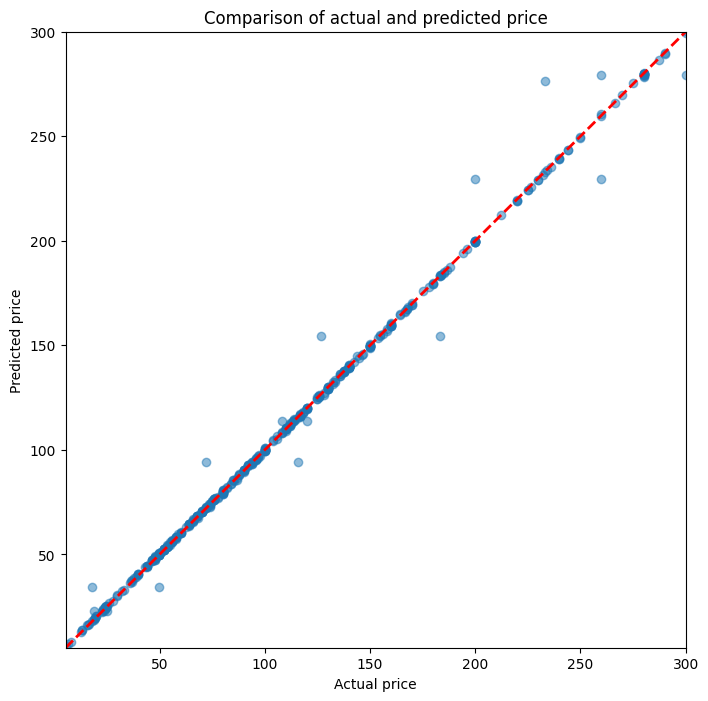

In [ ]:
y_pred = best_model.predict(X)

plt.figure(figsize=(8, 8))
plt.scatter(y, y_pred, alpha=0.5)
plt.plot([min(y), max(y)], [min(y), max(y)], linestyle='--', color='red', linewidth=2)
plt.xlabel('Actual price')
plt.ylabel('Predicted price')
plt.title('Comparison of actual and predicted price')

plt.xlim(min(y), 300)
plt.ylim(min(y), 300)
plt.show()

#### Analysis of the correlation between individual ingredients and product prices:

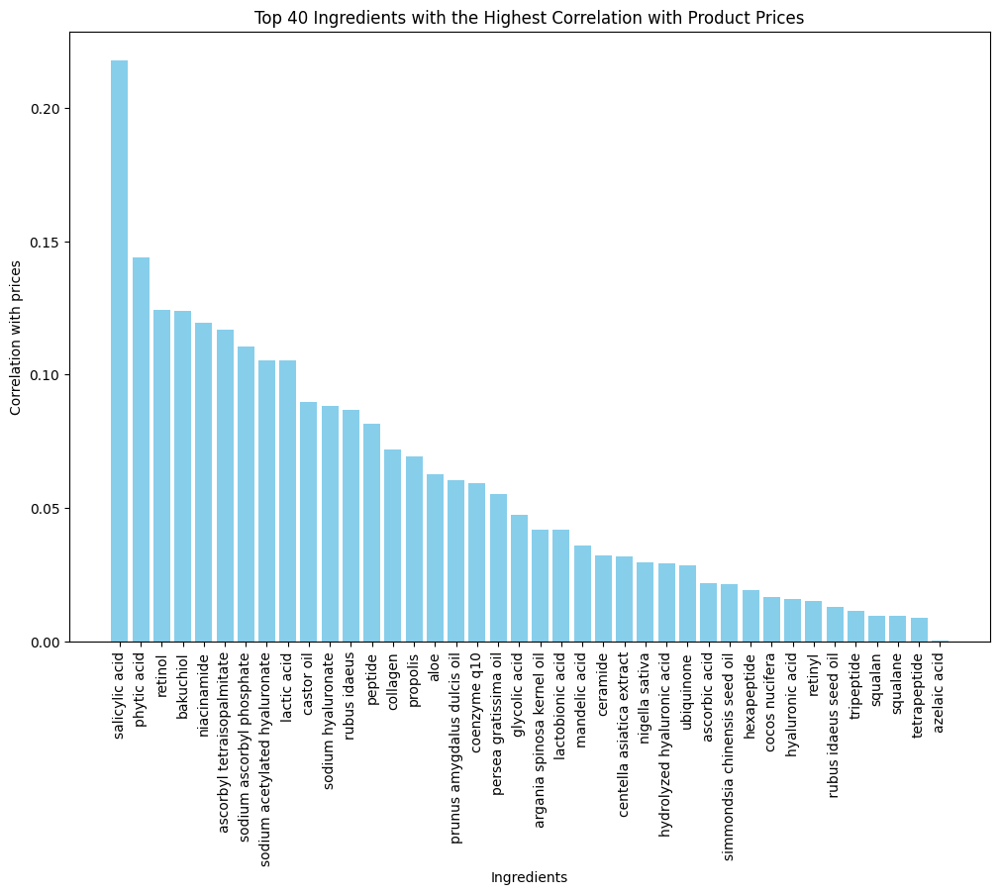

In [ ]:
interested_columns = ['lemmatized_ingredients'] + ['regular_unit_price_100ml']

df_selected = filtered_products[interested_columns].copy()

for ingredient in top_ingredients_lower:
    df_selected.loc[:, ingredient] = df_selected['lemmatized_ingredients'].str.contains(ingredient).astype(int)

df_selected = df_selected.drop(columns=['lemmatized_ingredients'])

correlations = df_selected.corr()
top_40_ingredients = correlations['regular_unit_price_100ml'].abs().sort_values(ascending=False)[1:41]

plt.figure(figsize=(12, 8))
plt.bar(top_40_ingredients.index, top_40_ingredients.values, color='skyblue')
plt.xlabel('Ingredients')
plt.ylabel('Correlation with prices')
plt.title('Top 40 Ingredients with the Highest Correlation with Product Prices')
plt.xticks(rotation=90)
plt.show()

# 12. Multi-class classification for predicting the effects of cosmetic products based on lemmatized ingredients:

In [ ]:
unique_effects=filtered_products['effect'].unique()
unique_effects

array(['odżywczy', 'nawilżający', 'ochrona UV',
       'Liftingujące,\nOdżywcze,\nPielęgnujące,\nPrzeciwstarzeniowe,\nUelastyczniające',
       'Nawilżające,\nPrzeciwstarzeniowe', 'Złuszczające',
       'Kojące,\nŁagodzące,\nNawilżające,\nOchronne,\nTonujące',
       'Nawilżające', 'ujędrniający',
       'Modelujące,\nOdbudowujące,\nRegenerujące', 'Odżywcze',
       'Seboregulujące', 'przeciwzmarszczkowy', 'Kojące',
       'Uelastyczniające', 'regenerujący', 'Łagodzące',
       'Nawilżające,\nPrzeciwzmarszczkowe,\nRegenerujące,\nWygładzające',
       'Rewitalizujące', 'Wzmacniające naczynka',
       'Odżywcze,\nRozświetlające,\nWygładzające', 'odmładzający',
       'Zmiękczające', 'Nawilżające,\nRegenerujące,\nWygładzające',
       'Regenerujące',
       'Łagodzące,\nNawilżające,\nPrzeciwstarzeniowe,\nWygładzające',
       'Odbudowujące,\nPrzeciwzmarszczkowe,\nRegenerujące,\nRozświetlające',
       'Rozświetlające', 'Odżywcze,\nPrzeciwzmarszczkowe',
       'Liftingujące,\nNapinające sk

#### TF-IDF representation for descriptions of cosmetic effects:

In [ ]:
def custom_tokenizer(text):
    words = text.split(',')
    words = [word.strip() for word in words]
    return words

tfidf_vectorizer = TfidfVectorizer(tokenizer=custom_tokenizer, preprocessor=None)
documents = filtered_products['effect']
tfidf_matrix = tfidf_vectorizer.fit_transform(documents)
words = tfidf_vectorizer.get_feature_names_out()
df_tfidf = pd.DataFrame(data=tfidf_matrix.toarray(), columns=words)
df_tfidf

/usr/local/lib/python3.10/dist-packages/sklearn/feature_extraction/text.py:528: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


,antybakteryjne,kojące,liftingujące,matujące,modelujące,napinające skórę,natłuszczające,nawilżające,nawilżający,ochrona uv,ochronne,odbudowujące,odmładzający,odświeżające,odświeżające kolor,odżywcze,odżywczy,pielęgnujące,przeciwstarzeniowe,przeciwzmarszczkowe,przeciwzmarszczkowy,redukujące cienie,regenerujące,regenerujący,relaksujące,rewitalizujące,rozjaśniające,rozświetlające,seboregulujące,tonujące,uelastyczniające,ujędrniające,ujędrniający,wielofunkcyjny,wygładzające,wzmacniające,wzmacniające naczynka,zapobieganie niedoskonałościom,zmiękczające,złuszczające,łagodzące
0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
469,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
470,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
471,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
472,0.0,0.0,0.449957,0.0,0.0,0.492634,0.0,0.256889,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.414578,0.358425,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.434184,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
df_tfidf.columns

Index(['antybakteryjne', 'kojące', 'liftingujące', 'matujące', 'modelujące',
       'napinające skórę', 'natłuszczające', 'nawilżające', 'nawilżający',
       'ochrona uv', 'ochronne', 'odbudowujące', 'odmładzający',
       'odświeżające', 'odświeżające kolor', 'odżywcze', 'odżywczy',
       'pielęgnujące', 'przeciwstarzeniowe', 'przeciwzmarszczkowe',
       'przeciwzmarszczkowy', 'redukujące cienie', 'regenerujące',
       'regenerujący', 'relaksujące', 'rewitalizujące', 'rozjaśniające',
       'rozświetlające', 'seboregulujące', 'tonujące', 'uelastyczniające',
       'ujędrniające', 'ujędrniający', 'wielofunkcyjny', 'wygładzające',
       'wzmacniające', 'wzmacniające naczynka',
       'zapobieganie niedoskonałościom', 'zmiękczające', 'złuszczające',
       'łagodzące'],
      dtype='object')

#### I am adding new columns to the data frame representing each of these unique effects, where a value of 1 means that the product has this effect and 0 otherwise:

In [ ]:
unique_effects = set()
for effects in filtered_products['effect'].str.split(','):
    unique_effects.update([effect.strip() for effect in effects])

unique_effects = list(unique_effects)

for effect in unique_effects:
    cleaned_effect = effect.strip()
    filtered_products[cleaned_effect] = filtered_products['effect'].str.contains(effect).astype(int)

print(filtered_products.head())

In [ ]:
pd.set_option('display.max_columns', None)
filtered_products

In [ ]:
print(filtered_products.sample(10))

In [ ]:
filtered_products.columns

Index(['product_name', 'product_description', 'count_of_ratings',
       'product_price', 'regular_price', 'product_url', 'effect',
       'ingredients', 'rating', 'capacity', 'regular_unit_price_100ml',
       'promotion_unit_price_100ml', 'brand', 'discount',
       'lemmatized_ingredients', 'language', 'Odżywcze', 'Uelastyczniające',
       'Matujące', 'nawilżający', 'regenerujący', 'Wzmacniające naczynka',
       'Tonujące', 'ujędrniający', 'Wygładzające', 'Przeciwzmarszczkowe',
       'Liftingujące', 'Łagodzące', 'Antybakteryjne', 'Odświeżające',
       'wielofunkcyjny', 'Pielęgnujące', 'Modelujące', 'Nawilżające',
       'Zapobieganie niedoskonałościom', 'przeciwzmarszczkowy', 'Kojące',
       'Przeciwstarzeniowe', 'Odświeżające kolor', 'Regenerujące',
       'ochrona UV', 'Złuszczające', 'Zmiękczające', 'Odbudowujące',
       'Rewitalizujące', 'Ujędrniające', 'Redukujące cienie', 'Wzmacniające',
       'Relaksujące', 'odmładzający', 'Napinające skórę', 'Ochronne',
       'odżywc

#### After using synonyms, I remove unnecessary columns that are synonyms for other effects and keep the main category:

In [ ]:
effects_synonyms = {
    'nawilżający': ['nawilżający', 'Nawilżające'],
    'Wzmacniający naczynka': ['Wzmacniające naczynka', 'Wzmacniające'],
    'przeciwzmarszczkowy': ['przeciwzmarszczkowy', 'Przeciwzmarszczkowe', 'Przeciwstarzeniowe', 'odmładzający', 'Rewitalizujące'],
    'ochrona UV': ['ochrona UV', 'Ochronne'],
    'ujędrniający': ['ujędrniający', 'Ujędrniające'],
    'Odświeżające kolor': ['Odświeżające kolor', 'Odświeżające'],
    'odżywczy': ['odżywczy', 'Odżywcze'],
    'regenerujący': ['regenerujący', 'Regenerujące']
}

unique_effects = set()
for effects in filtered_products['effect'].str.split(','):
    unique_effects.update([effect.strip() for effect in effects])

unique_effects = list(unique_effects)

for effect, synonyms in effects_synonyms.items():
    for synonym in synonyms:
        if synonym in unique_effects:
            unique_effects.remove(synonym)

for effect in unique_effects:
    cleaned_effect = effect.strip()
    filtered_products[effect] = filtered_products['effect'].str.contains(effect).astype(int)

for synonyms in effects_synonyms.values():
    main_effect = synonyms[0]
    for synonym in synonyms[1:]:
        if synonym in filtered_products.columns:
            filtered_products[main_effect] = filtered_products[main_effect] | filtered_products[synonym]
            filtered_products.drop(columns=[synonym], inplace=True)

print(filtered_products.head())

In [ ]:
filtered_products.columns

Index(['product_name', 'product_description', 'count_of_ratings',
       'product_price', 'regular_price', 'product_url', 'effect',
       'ingredients', 'rating', 'capacity', 'regular_unit_price_100ml',
       'promotion_unit_price_100ml', 'brand', 'discount',
       'lemmatized_ingredients', 'language', 'Uelastyczniające', 'Matujące',
       'nawilżający', 'regenerujący', 'Wzmacniające naczynka', 'Tonujące',
       'ujędrniający', 'Wygładzające', 'Liftingujące', 'Łagodzące',
       'Antybakteryjne', 'wielofunkcyjny', 'Pielęgnujące', 'Modelujące',
       'Zapobieganie niedoskonałościom', 'przeciwzmarszczkowy', 'Kojące',
       'Odświeżające kolor', 'ochrona UV', 'Złuszczające', 'Zmiękczające',
       'Odbudowujące', 'Redukujące cienie', 'Relaksujące', 'Napinające skórę',
       'odżywczy', 'Seboregulujące', 'Natłuszczające', 'Rozjaśniające',
       'Rozświetlające'],
      dtype='object')

####I'm checking whether there are products that do not have any cosmetic effects:

In [ ]:
columns_to_exclude = ['product_name', 'product_description', 'count_of_ratings', 'product_price',
                      'regular_price', 'product_url', 'effect', 'ingredients', 'rating', 'capacity',
                      'regular_unit_price_100ml', 'promotion_unit_price_100ml', 'brand', 'discount',
                      'lemmatized_ingredients', 'language']

desired_columns = [col for col in filtered_products.columns if col not in columns_to_exclude]

products_with_no_effects = filtered_products[
    (filtered_products[desired_columns] == 0).all(axis=1)
]

products_with_no_effects

,product_name,product_description,count_of_ratings,product_price,regular_price,product_url,effect,ingredients,rating,capacity,regular_unit_price_100ml,promotion_unit_price_100ml,brand,discount,lemmatized_ingredients,language,Uelastyczniające,Matujące,nawilżający,regenerujący,Wzmacniające naczynka,Tonujące,ujędrniający,Wygładzające,Liftingujące,Łagodzące,Antybakteryjne,wielofunkcyjny,Pielęgnujące,Modelujące,Zapobieganie niedoskonałościom,przeciwzmarszczkowy,Kojące,Odświeżające kolor,ochrona UV,Złuszczające,Zmiękczające,Odbudowujące,Redukujące cienie,Relaksujące,Napinające skórę,odżywczy,Seboregulujące,Natłuszczające,Rozjaśniające,Rozświetlające


In [ ]:
desired_columns

['Uelastyczniające',
 'Matujące',
 'nawilżający',
 'regenerujący',
 'Wzmacniające naczynka',
 'Tonujące',
 'ujędrniający',
 'Wygładzające',
 'Liftingujące',
 'Łagodzące',
 'Antybakteryjne',
 'wielofunkcyjny',
 'Pielęgnujące',
 'Modelujące',
 'Zapobieganie niedoskonałościom',
 'przeciwzmarszczkowy',
 'Kojące',
 'Odświeżające kolor',
 'ochrona UV',
 'Złuszczające',
 'Zmiękczające',
 'Odbudowujące',
 'Redukujące cienie',
 'Relaksujące',
 'Napinające skórę',
 'odżywczy',
 'Seboregulujące',
 'Natłuszczające',
 'Rozjaśniające',
 'Rozświetlające']

## Classification models that are designed to predict the effects of cosmetics based on their ingredients, presenting the results in the form of probabilities for various effects:

#### RandomForestClassifier

In [ ]:
y = filtered_products[desired_columns]

tfidf_vectorizer = TfidfVectorizer(token_pattern=r'[a-z]{2,}(?=\,|$)', preprocessor=None)
tfidf_matrix = tfidf_vectorizer.fit_transform(filtered_products['lemmatized_ingredients'])
scaler = StandardScaler()
tfidf_matrix_std = scaler.fit_transform(tfidf_matrix.toarray())

model = RandomForestClassifier(n_estimators=100, random_state=42)
multi_model = MultiOutputClassifier(model)

X_train, X_test, y_train, y_test = train_test_split(tfidf_matrix_std, y, test_size=0.2, random_state=42)

multi_model.fit(X_train, y_train)

y_pred = multi_model.predict(X_test)

effect_names = y.columns
product_names = filtered_products['product_name']

for product_name, product_pred, true_effect in zip(product_names, y_pred, filtered_products['effect']):
    print(f"Product name: {product_name}")
    print(f"Real effect: {true_effect}")
    print("Probabilities:")

    for effect, prob in zip(effect_names, product_pred):
        print(f" - Effect '{effect}': {prob:.3f}")

    max_prob_index = np.argmax(product_pred)
    print(f"Most likely effect: '{effect_names[max_prob_index]}' with probability {product_pred[max_prob_index]:.3f}\n")


In [ ]:
report = classification_report(y_test, y_pred, target_names=effect_names)
print(report)

                                precision    recall  f1-score   support

                   Relaksujące       0.00      0.00      0.00         0
                        Kojące       0.00      0.00      0.00         2
                  ujędrniający       0.00      0.00      0.00         3
                   nawilżający       0.75      0.32      0.44        38
                  Wygładzające       0.00      0.00      0.00         4
                  Zmiękczające       0.00      0.00      0.00         2
                      Tonujące       0.00      0.00      0.00         1
         Wzmacniające naczynka       0.00      0.00      0.00         2
                  Pielęgnujące       0.00      0.00      0.00         1
           przeciwzmarszczkowy       0.75      0.29      0.41        21
                  regenerujący       0.00      0.00      0.00         8
                Rozświetlające       0.00      0.00      0.00         0
                     Łagodzące       0.00      0.00      0.00  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


#### The model seems to have some difficulty predicting some labels, especially those with low frequency in the training data. Some of them have zero scores for all measures, suggesting that they were not predicted correctly.

This may definitely be due to the small amount of training data, considering that we are based on ingredients that are diverse.

However, I will see how the model performs using artificial neural networks:

In [ ]:
y = filtered_products[desired_columns]

tfidf_vectorizer = TfidfVectorizer(token_pattern=r'[a-z]{2,}(?=\,|$)', preprocessor=None)
tfidf_matrix = tfidf_vectorizer.fit_transform(filtered_products['lemmatized_ingredients'])

scaler = StandardScaler()
tfidf_matrix_std = scaler.fit_transform(tfidf_matrix.toarray())

X_train, X_test, y_train, y_test = train_test_split(tfidf_matrix_std, y, test_size=0.2, random_state=42)

def create_nn_model(num_layers=1, units_per_layer=32, activation='relu', dropout_rate=0.2, l2_reg=0.01):
    model = Sequential()
    model.add(BatchNormalization(input_shape=(tfidf_matrix_std.shape[1],)))

    for _ in range(num_layers):
        model.add(Dense(units_per_layer, activation=activation, kernel_regularizer=tf.keras.regularizers.l2(l2_reg)))
        model.add(BatchNormalization())
        model.add(Dropout(dropout_rate))

    model.add(Dense(y.shape[1], activation='softmax'))
    model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    return model

best_hamming = float('inf')
best_params = None

for num_layers in [2, 3, 4]:
    for units_per_layer in [64, 128, 258, 512]:
        for activation in ['relu', 'sigmoid']:
            for dropout_rate in [0.2, 0.5]:
                for l2_reg in [0.01, 0.001, 0.0001]:
                    model = create_nn_model(num_layers=num_layers, units_per_layer=units_per_layer,
                                            activation=activation, dropout_rate=dropout_rate, l2_reg=l2_reg)

                    sample_weights = compute_sample_weight(class_weight='balanced', y=y_train)
                    model.fit(X_train, y_train, sample_weight=sample_weights, epochs=20, batch_size=32, verbose=0)

                    y_pred = model.predict(X_test)
                    hamming = hamming_loss(y_test, (y_pred > 0.5).astype(int))

                    print(f"Config: num_layers={num_layers}, units_per_layer={units_per_layer}, activation={activation}, dropout_rate={dropout_rate}, l2_reg={l2_reg}, Hamming Loss: {hamming}")

                    if hamming < best_hamming:
                        best_hamming = hamming
                        best_params = {'num_layers': num_layers, 'units_per_layer': units_per_layer,
                                       'activation': activation, 'dropout_rate': dropout_rate, 'l2_reg': l2_reg}

print(f"The best parameters: {best_params}")
print(f"The best Hamming Loss: {best_hamming}")


3/3 [==============================] - 0s 5ms/step
Config: num_layers=2, units_per_layer=64, activation=relu, dropout_rate=0.2, l2_reg=0.01, Hamming Loss: 0.04491228070175438
3/3 [==============================] - 0s 8ms/step
Config: num_layers=2, units_per_layer=64, activation=relu, dropout_rate=0.2, l2_reg=0.001, Hamming Loss: 0.0456140350877193
3/3 [==============================] - 0s 5ms/step
Config: num_layers=2, units_per_layer=64, activation=relu, dropout_rate=0.2, l2_reg=0.0001, Hamming Loss: 0.04280701754385965
3/3 [==============================] - 0s 6ms/step
Config: num_layers=2, units_per_layer=64, activation=relu, dropout_rate=0.5, l2_reg=0.01, Hamming Loss: 0.04280701754385965


3/3 [==============================] - 0s 6ms/step
Config: num_layers=2, units_per_layer=64, activation=relu, dropout_rate=0.5, l2_reg=0.001, Hamming Loss: 0.0431578947368421


3/3 [==============================] - 0s 6ms/step
Config: num_layers=2, units_per_layer=64, activation=relu, dropout_rate=0.5, l2_reg=0.0001, Hamming Loss: 0.04245614035087719
3/3 [==============================] - 0s 6ms/step
Config: num_layers=2, units_per_layer=64, activation=sigmoid, dropout_rate=0.2, l2_reg=0.01, Hamming Loss: 0.04105263157894737
3/3 [==============================] - 0s 4ms/step
Config: num_layers=2, units_per_layer=64, activation=sigmoid, dropout_rate=0.2, l2_reg=0.001, Hamming Loss: 0.04105263157894737
3/3 [==============================] - 0s 5ms/step
Config: num_layers=2, units_per_layer=64, activation=sigmoid, dropout_rate=0.2, l2_reg=0.0001, Hamming Loss: 0.04105263157894737
3/3 [==============================] - 1s 6ms/step
Config: num_layers=2, units_per_layer=64, activation=sigmoid, dropout_rate=0.5, l2_reg=0.01, Hamming Loss: 0.04105263157894737
3/3 [==============================] - 0s 5ms/step
Config: num_layers=2, units_per_layer=64, activation=sigm

#### I will try to increase batch_size and epochs:

In [ ]:
best_hamming = float('inf')
best_params = None

for num_layers in [4]:
    for units_per_layer in [64]:
        for activation in ['relu']:
            for dropout_rate in [0.5]:
                for l2_reg in [0.01]:
                    for batch_size in [32, 64, 128]:
                        for epochs in [20, 25, 30, 35, 40]:
                            model = create_nn_model(num_layers=num_layers, units_per_layer=units_per_layer,
                                                    activation=activation, dropout_rate=dropout_rate, l2_reg=l2_reg)

                            sample_weights = compute_sample_weight(class_weight='balanced', y=y_train)
                            model.fit(X_train, y_train, sample_weight=sample_weights, epochs=epochs,
                                      batch_size=batch_size, verbose=0)

                            y_pred = model.predict(X_test)
                            hamming = hamming_loss(y_test, (y_pred > 0.5).astype(int))

                            print(f"Config: num_layers={num_layers}, units_per_layer={units_per_layer}, "
                                  f"activation={activation}, dropout_rate={dropout_rate}, l2_reg={l2_reg}, "
                                  f"batch_size={batch_size}, epochs={epochs}, Hamming Loss: {hamming}")

                            if hamming < best_hamming:
                                best_hamming = hamming
                                best_params = {'num_layers': num_layers, 'units_per_layer': units_per_layer,
                                               'activation': activation, 'dropout_rate': dropout_rate,
                                               'l2_reg': l2_reg, 'batch_size': batch_size, 'epochs': epochs}

print(f"The best parameters: {best_params}")
print(f"The best Hamming Loss: {best_hamming}")

3/3 [==============================] - 0s 7ms/step
Config: num_layers=4, units_per_layer=64, activation=relu, dropout_rate=0.5, l2_reg=0.01, batch_size=32, epochs=20, Hamming Loss: 0.04105263157894737
3/3 [==============================] - 0s 5ms/step
Config: num_layers=4, units_per_layer=64, activation=relu, dropout_rate=0.5, l2_reg=0.01, batch_size=32, epochs=25, Hamming Loss: 0.041403508771929824
3/3 [==============================] - 0s 5ms/step
Config: num_layers=4, units_per_layer=64, activation=relu, dropout_rate=0.5, l2_reg=0.01, batch_size=32, epochs=30, Hamming Loss: 0.04105263157894737
3/3 [==============================] - 0s 6ms/step
Config: num_layers=4, units_per_layer=64, activation=relu, dropout_rate=0.5, l2_reg=0.01, batch_size=32, epochs=35, Hamming Loss: 0.04175438596491228
3/3 [==============================] - 0s 6ms/step
Config: num_layers=4, units_per_layer=64, activation=relu, dropout_rate=0.5, l2_reg=0.01, batch_size=32, epochs=40, Hamming Loss: 0.044210526315

# The results are very similar. I'm staying with epochs=20, batch_size=32

In [ ]:
best_model = create_nn_model(num_layers=4, units_per_layer=64, activation='relu', dropout_rate=0.5, l2_reg=0.01)
best_model.fit(X_train, y_train, sample_weight=sample_weights, epochs=20, batch_size=32, verbose=0)
y_pred = best_model.predict(X_test)



3/3 [==============================] - 0s 6ms/step


#### Comparison of the expected effects of the cosmetic with the actual effect:

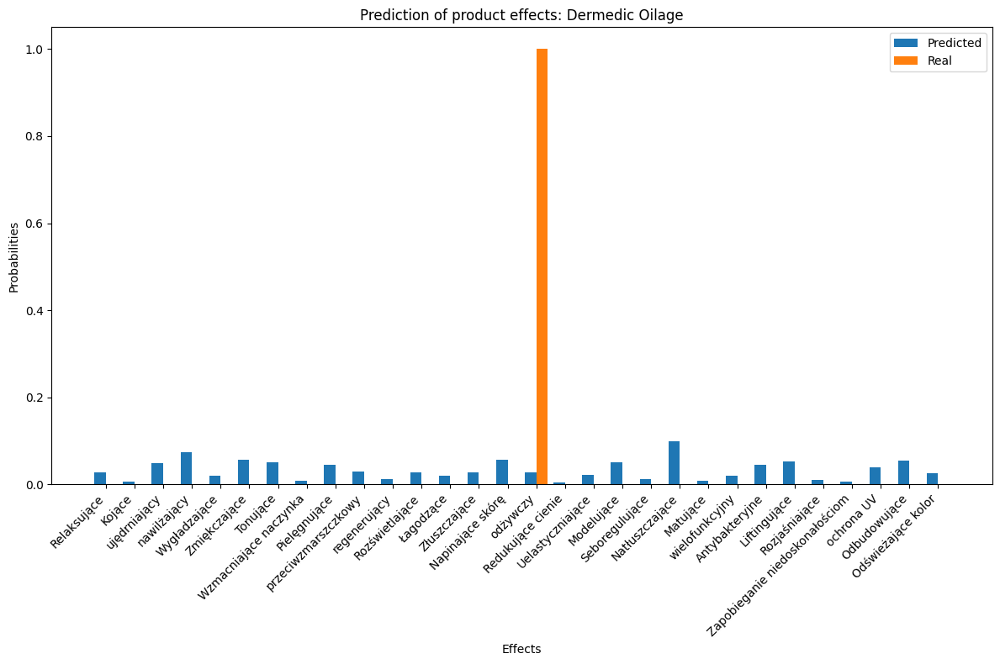

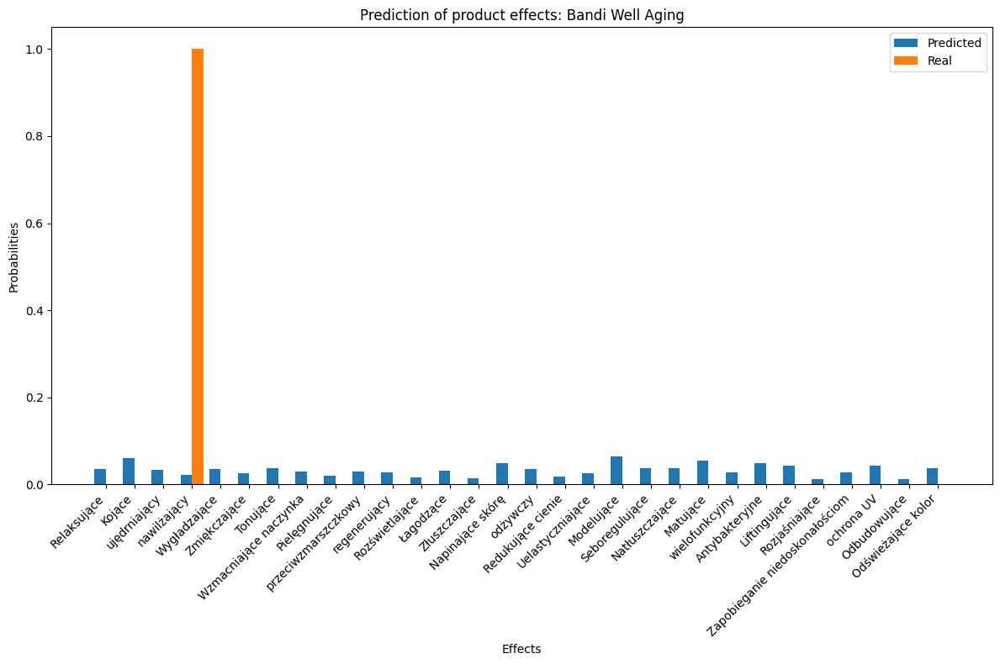

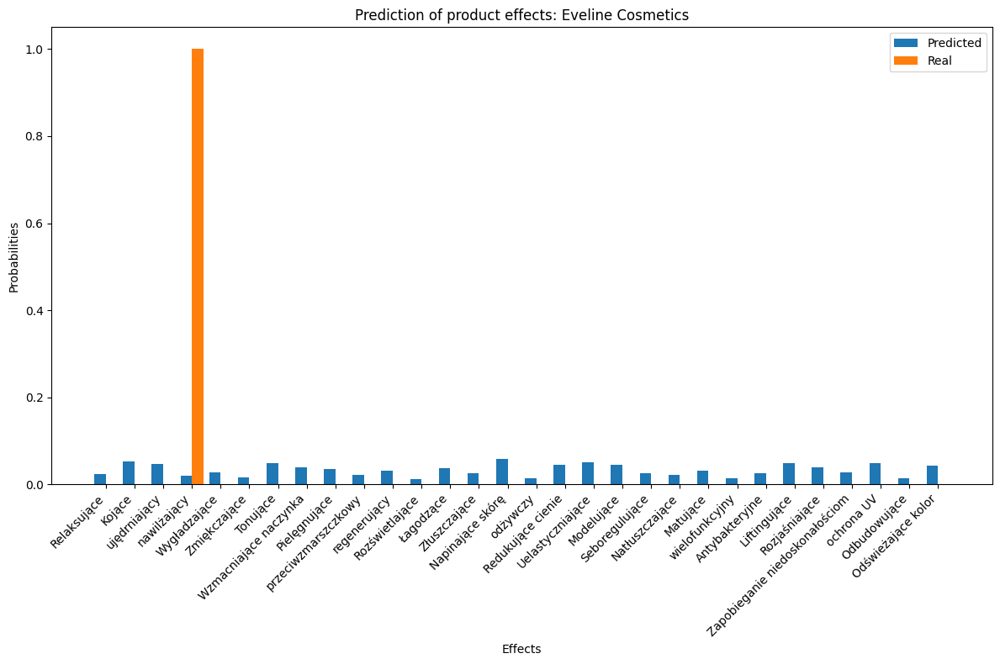

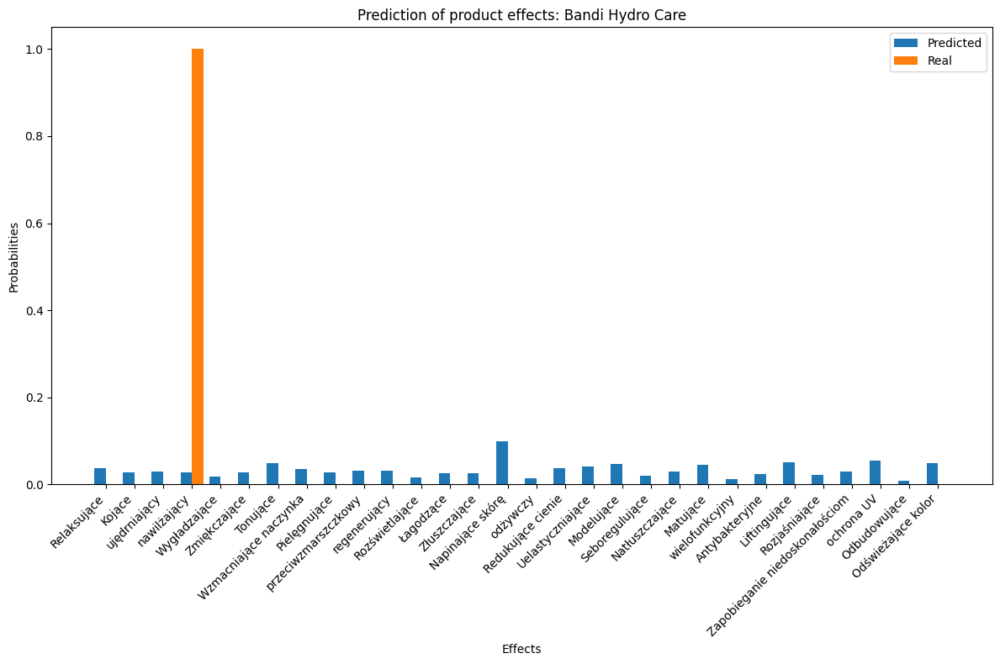

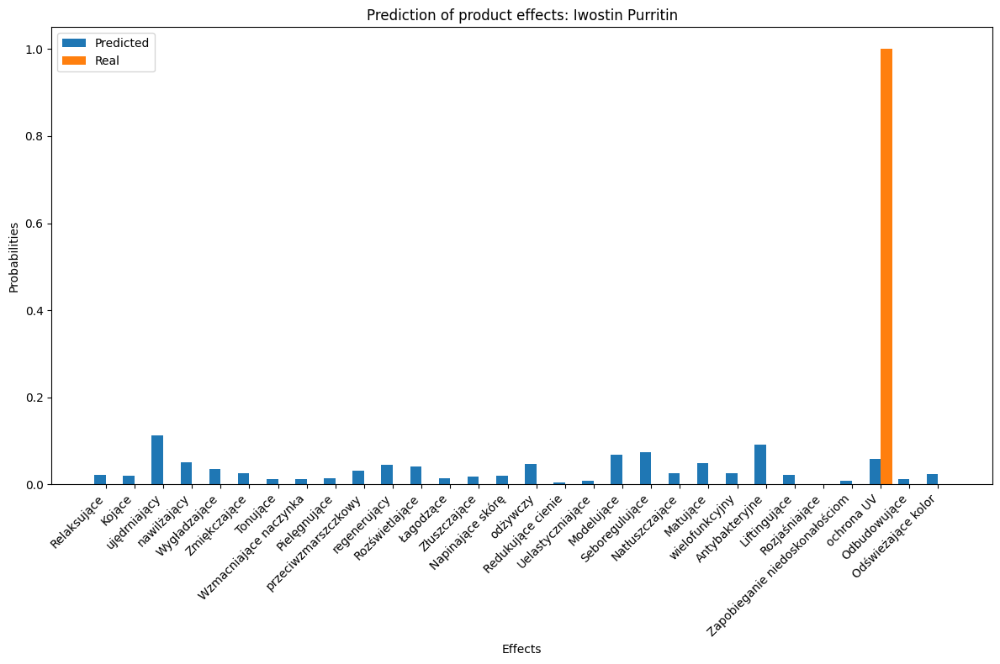

...

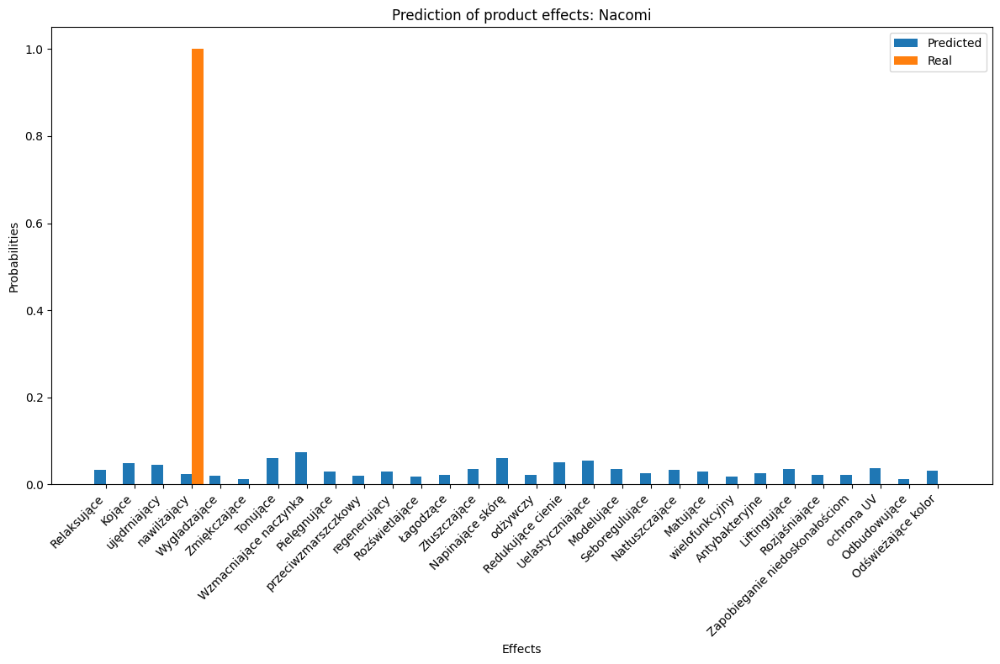

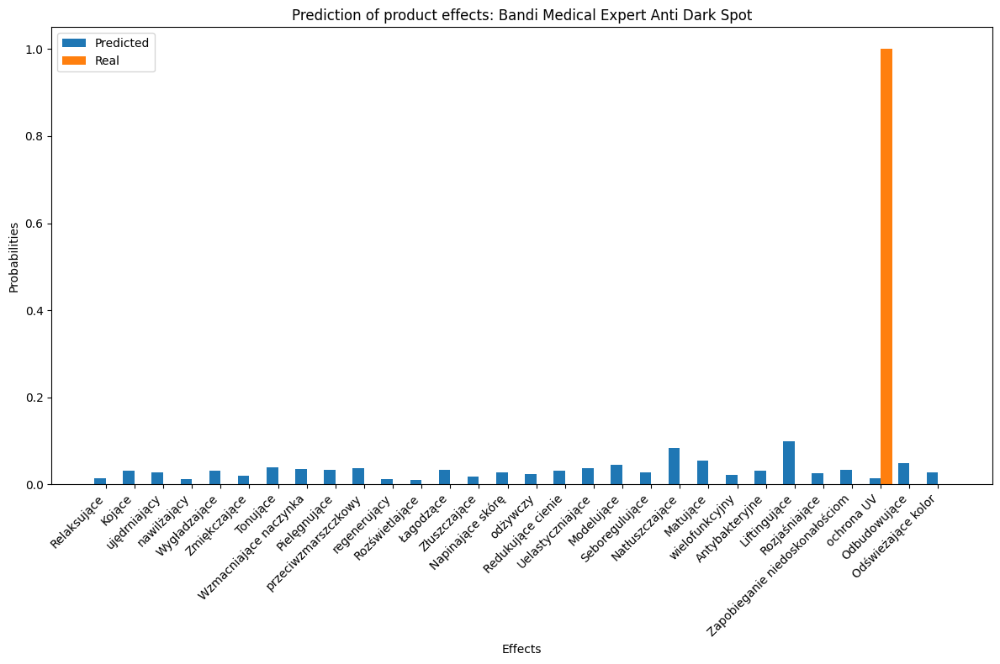

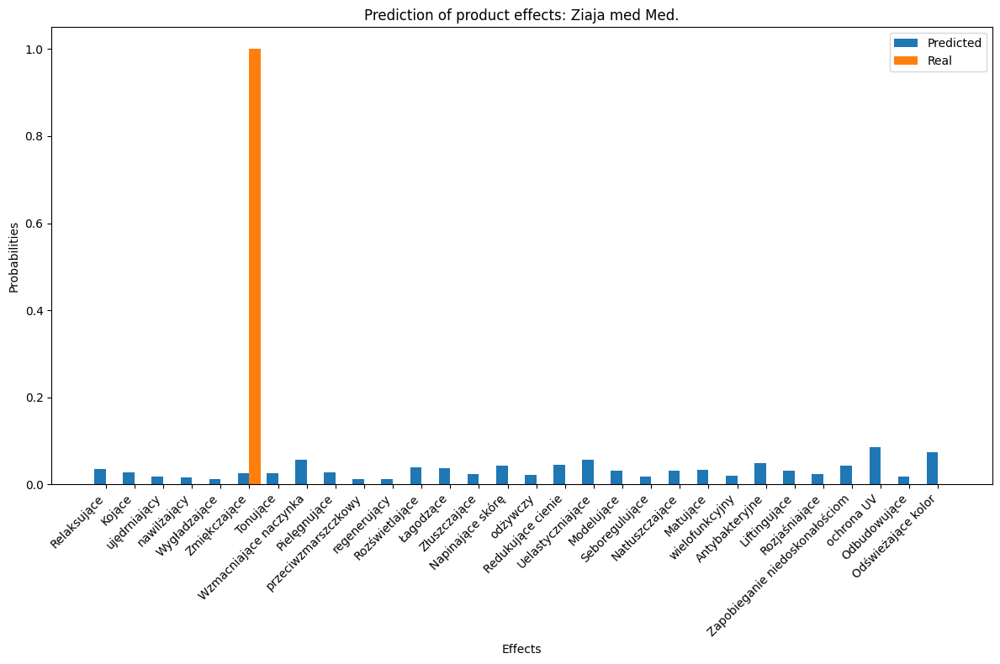

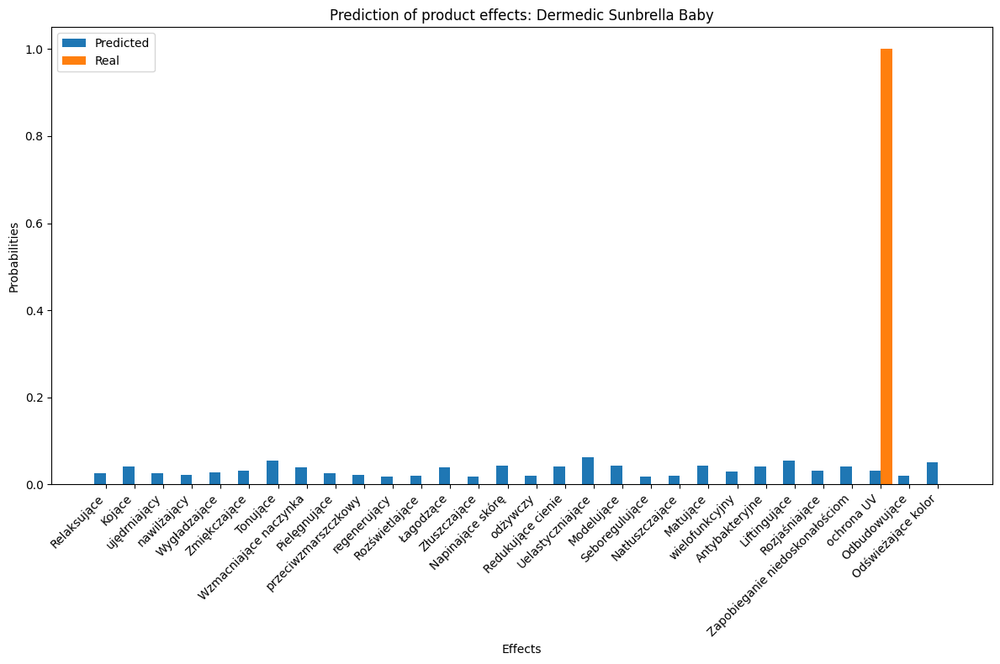

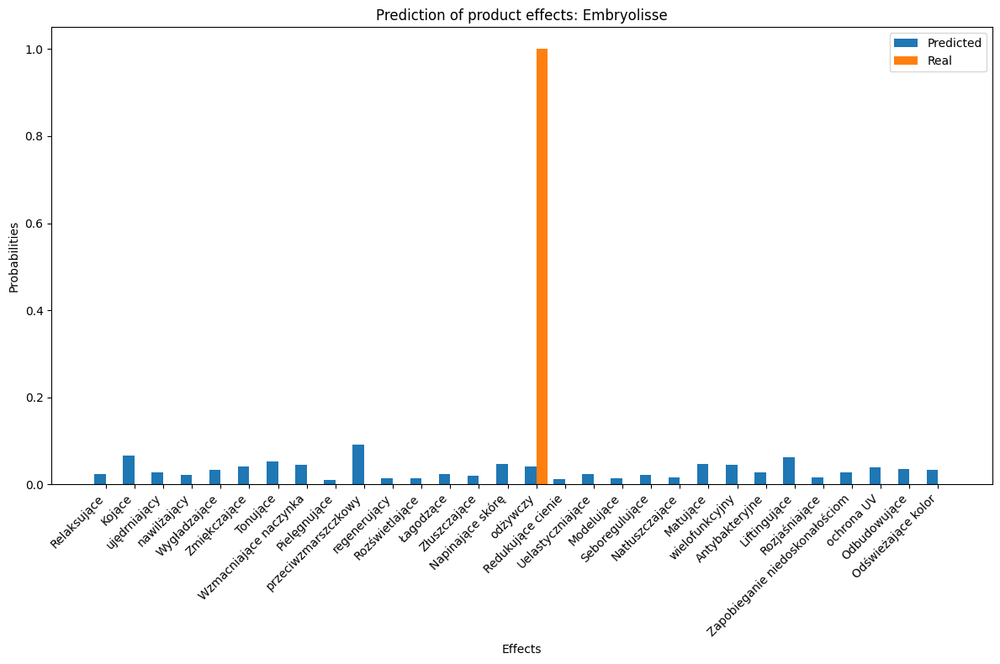

In [ ]:
effect_names = y.columns
sample_indices = range(len(X_test))

for sample_index in sample_indices:
    product_name = filtered_products['product_name'].iloc[sample_index]
    product_pred = y_pred[sample_index]
    true_effect = filtered_products[desired_columns].iloc[sample_index]

    fig, ax = plt.subplots(figsize=(12, 8))

    indexes = np.arange(len(effect_names))
    bar_width = 0.4

    bars1 = plt.bar(indexes, product_pred, bar_width, label='Predicted')
    bars2 = plt.bar(indexes + bar_width, true_effect, bar_width, label='Real')

    plt.xlabel('Effects')
    plt.ylabel('Probabilities')
    plt.title(f'Prediction of product effects: {product_name}')
    plt.xticks(indexes + bar_width / 2, effect_names, rotation=45, ha='right')
    plt.legend()

    plt.tight_layout()
    plt.show()


In [ ]:
sample_indices = range(len(X_test))

for sample_index in sample_indices:
    product_name = filtered_products['product_name'].iloc[sample_index]
    product_pred = y_pred[sample_index]
    true_effect = filtered_products[desired_columns].iloc[sample_index]
    effects = filtered_products['effect'].iloc[sample_index]

    print(f"Product name: {product_name}")
    print(f"Real effects: {effects}")
    print("Probabilities:")

    for effect, prob in zip(effect_names, product_pred):
        print(f" -Effect '{effect}': {prob:.3f}")

    max_prob_index = np.argmax(product_pred)
    print(f"Most likely effect: '{effect_names[max_prob_index]}' with probability {product_pred[max_prob_index]:.3f}\n")


Product name: Dermedic Oilage
Real effects: odżywczy
Probabilities:
 -Effect 'Relaksujące': 0.028
 -Effect 'Kojące': 0.007
 -Effect 'ujędrniający': 0.049
 -Effect 'nawilżający': 0.074
 -Effect 'Wygładzające': 0.020
 -Effect 'Zmiękczające': 0.057
 -Effect 'Tonujące': 0.051
 -Effect 'Wzmacniające naczynka': 0.008
 -Effect 'Pielęgnujące': 0.046
 -Effect 'przeciwzmarszczkowy': 0.030
 -Effect 'regenerujący': 0.013
 -Effect 'Rozświetlające': 0.028
 -Effect 'Łagodzące': 0.019
 -Effect 'Złuszczające': 0.027
 -Effect 'Napinające skórę': 0.056
 -Effect 'odżywczy': 0.027
 -Effect 'Redukujące cienie': 0.005
 -Effect 'Uelastyczniające': 0.021
 -Effect 'Modelujące': 0.051
 -Effect 'Seboregulujące': 0.013
 -Effect 'Natłuszczające': 0.099
 -Effect 'Matujące': 0.009
 -Effect 'wielofunkcyjny': 0.021
 -Effect 'Antybakteryjne': 0.045
 -Effect 'Liftingujące': 0.054
 -Effect 'Rozjaśniające': 0.011
 -Effect 'Zapobieganie niedoskonałościom': 0.007
 -Effect 'ochrona UV': 0.039
 -Effect 'Odbudowujące': 0.055
 -

#### In summary, the models seem to have difficulty predicting multiple labels due to insufficient training data.

# 13. Clustering cosmetics based on their composition and effects. I select the optimal number of clusters by assessing the quality of clustering using Silhouette Score and Davies-Bouldin Index metrics. Then, I visualize the clustering results in an interactive graph using principal component analysis (PCA) and the Bokeh library.

In [ ]:
desired_columns

['Uelastyczniające',
 'Matujące',
 'nawilżający',
 'regenerujący',
 'Wzmacniające naczynka',
 'Tonujące',
 'ujędrniający',
 'Wygładzające',
 'Liftingujące',
 'Łagodzące',
 'Antybakteryjne',
 'wielofunkcyjny',
 'Pielęgnujące',
 'Modelujące',
 'Zapobieganie niedoskonałościom',
 'przeciwzmarszczkowy',
 'Kojące',
 'Odświeżające kolor',
 'ochrona UV',
 'Złuszczające',
 'Zmiękczające',
 'Odbudowujące',
 'Redukujące cienie',
 'Relaksujące',
 'Napinające skórę',
 'odżywczy',
 'Seboregulujące',
 'Natłuszczające',
 'Rozjaśniające',
 'Rozświetlające']

In [ ]:
filtered_products

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For k=5, Silhouette Score: 0.2104156823880763, Davies-Bouldin Index: 1.59508627897988


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For k=6, Silhouette Score: 0.12499054602831948, Davies-Bouldin Index: 1.3245981608747288


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For k=7, Silhouette Score: 0.34594265017271064, Davies-Bouldin Index: 1.2676233964804666


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For k=8, Silhouette Score: 0.3261980117414928, Davies-Bouldin Index: 1.3336061947569653


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For k=9, Silhouette Score: 0.14041905476042127, Davies-Bouldin Index: 1.3565137927152437


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For k=10, Silhouette Score: 0.16322374672551404, Davies-Bouldin Index: 1.2717320121600282


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For k=11, Silhouette Score: 0.24739095034978856, Davies-Bouldin Index: 1.358028252060775


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For k=12, Silhouette Score: 0.2187663681124472, Davies-Bouldin Index: 1.05464642654406


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For k=13, Silhouette Score: 0.2737664389254028, Davies-Bouldin Index: 1.1699229200818118


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For k=14, Silhouette Score: 0.2888027167604613, Davies-Bouldin Index: 1.0985355624239834


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For k=15, Silhouette Score: 0.2914288645765209, Davies-Bouldin Index: 1.0137296806523084


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For k=16, Silhouette Score: 0.33357811594981335, Davies-Bouldin Index: 1.0030588760060626


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For k=17, Silhouette Score: 0.32027158485404095, Davies-Bouldin Index: 1.0131220823545695


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For k=18, Silhouette Score: 0.3342026971474567, Davies-Bouldin Index: 0.906592454669223


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For k=19, Silhouette Score: 0.38601122239274765, Davies-Bouldin Index: 0.8824100646194684


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For k=20, Silhouette Score: 0.40192038885088793, Davies-Bouldin Index: 0.8152428778330421


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For k=21, Silhouette Score: 0.38942767106168497, Davies-Bouldin Index: 0.802605718464555


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For k=22, Silhouette Score: 0.4279062137746449, Davies-Bouldin Index: 0.7911821295500588


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For k=23, Silhouette Score: 0.456899000818579, Davies-Bouldin Index: 0.7807158944498359


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For k=24, Silhouette Score: 0.48984768288155217, Davies-Bouldin Index: 0.7700439455437907


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For k=25, Silhouette Score: 0.46186184257848006, Davies-Bouldin Index: 0.7216544161801776


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For k=26, Silhouette Score: 0.49384784811874416, Davies-Bouldin Index: 0.6670199931328491


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For k=27, Silhouette Score: 0.5157418182317492, Davies-Bouldin Index: 0.7207734858775278


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For k=28, Silhouette Score: 0.5353285919117405, Davies-Bouldin Index: 0.7119893309505877


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For k=29, Silhouette Score: 0.5502376602921681, Davies-Bouldin Index: 0.6608068289651334


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For k=30, Silhouette Score: 0.5621092207714473, Davies-Bouldin Index: 0.7616103608614531


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For k=31, Silhouette Score: 0.5641223770463534, Davies-Bouldin Index: 0.7494594912998593


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For k=32, Silhouette Score: 0.567133004852293, Davies-Bouldin Index: 0.7284436573864188


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For k=33, Silhouette Score: 0.5688309574337579, Davies-Bouldin Index: 0.7052447813096955


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For k=34, Silhouette Score: 0.5682028445149743, Davies-Bouldin Index: 0.7421984774960552


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For k=35, Silhouette Score: 0.5669596356833244, Davies-Bouldin Index: 0.7326749936707783


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For k=36, Silhouette Score: 0.5705644425153508, Davies-Bouldin Index: 0.6697608041538154


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For k=37, Silhouette Score: 0.5723227632899881, Davies-Bouldin Index: 0.6133807079035193


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For k=38, Silhouette Score: 0.5711730932374179, Davies-Bouldin Index: 0.6451481755296743


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For k=39, Silhouette Score: 0.5713132845943387, Davies-Bouldin Index: 0.5838988284237305


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For k=40, Silhouette Score: 0.5709920485959967, Davies-Bouldin Index: 0.5589701152806559
The best number of clusters: 37
Best Silhouette Score: 0.5723227632899881
Best Davies-Bouldin Index: 0.6133807079035193


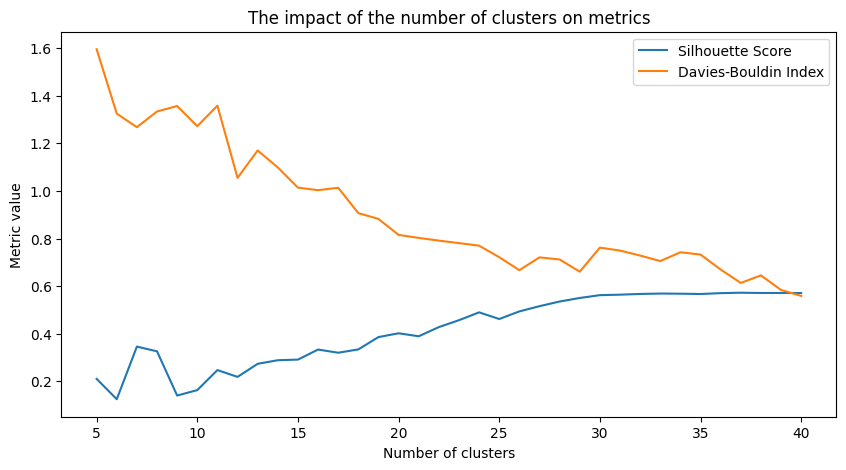

In [ ]:
X = filtered_products[desired_columns]
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

tfidf_vectorizer = TfidfVectorizer(token_pattern=r'[a-z]{2,}(?=\,|$)', preprocessor=None)
tfidf_matrix = tfidf_vectorizer.fit_transform(filtered_products['lemmatized_ingredients'])

X_combined = hstack([X_scaled, tfidf_matrix])

possible_k_values = list(range(5, 41))

best_k = None
best_silhouette_score = -1
best_davies_bouldin_score = float('inf')

silhouette_scores = []
davies_bouldin_scores = []

for k in possible_k_values:
    kmeans = KMeans(n_clusters=k, random_state=0)
    clusters = kmeans.fit_predict(X_combined.toarray())

    silhouette_avg = silhouette_score(X_combined, clusters)
    db_index = davies_bouldin_score(X_combined.toarray(), clusters)

    silhouette_scores.append(silhouette_avg)
    davies_bouldin_scores.append(db_index)

    print(f"For k={k}, Silhouette Score: {silhouette_avg}, Davies-Bouldin Index: {db_index}")

    if silhouette_avg > best_silhouette_score:
        best_silhouette_score = silhouette_avg
        best_davies_bouldin_score = db_index
        best_k = k
    elif silhouette_avg == best_silhouette_score and db_index < best_davies_bouldin_score:
        best_silhouette_score = silhouette_avg
        best_davies_bouldin_score = db_index
        best_k = k

print(f"The best number of clusters: {best_k}")
print(f"Best Silhouette Score: {best_silhouette_score}")
print(f"Best Davies-Bouldin Index: {best_davies_bouldin_score}")

plt.figure(figsize=(10, 5))
plt.plot(possible_k_values, silhouette_scores, label='Silhouette Score')
plt.plot(possible_k_values, davies_bouldin_scores, label='Davies-Bouldin Index')
plt.xlabel('Number of clusters')
plt.ylabel('Metric value')
plt.title('The impact of the number of clusters on metrics')
plt.legend()
plt.show()

#### Creating a dendrogram:

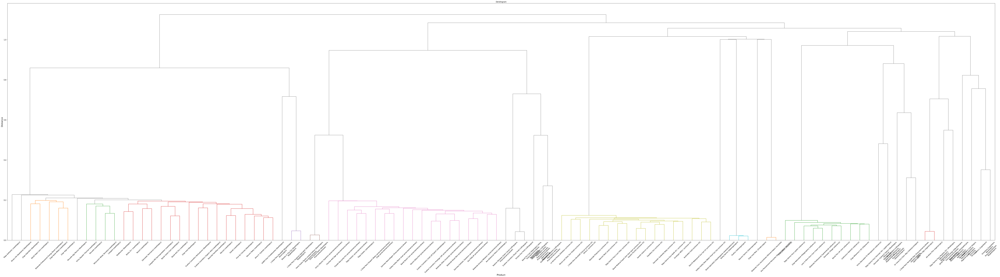

In [ ]:
duplicates = filtered_products[filtered_products.duplicated(subset=['product_name'], keep=False)]
product_names = filtered_products['product_name']
unique_products = duplicates.drop_duplicates(subset=['product_name'])

X = unique_products[desired_columns]
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

tfidf_vectorizer = TfidfVectorizer(token_pattern=r'[a-z]{2,}(?=\,|$)', preprocessor=None)
tfidf_matrix = tfidf_vectorizer.fit_transform(unique_products['lemmatized_ingredients'])

X_combined = hstack([X_scaled, tfidf_matrix])

product_names_with_effect = [f"{name} ({effect})" for name, effect in zip(unique_products['product_name'], unique_products['effect'])]

linked = linkage(X_combined.toarray(), 'average', metric='cosine')


plt.figure(figsize=(120, 30))
dendrogram(linked,
           orientation='top',
           labels=product_names_with_effect,
           leaf_rotation=45.,
           leaf_font_size=12.,
           p=5,
           color_threshold=0.2,
           above_threshold_color='gray')
plt.title('Dendrogram')
plt.xlabel('Product', fontsize=16)
plt.ylabel('Distance', fontsize=16)
plt.xticks(rotation=45., fontsize=11)
plt.yticks(fontsize=12)
plt.subplots_adjust(left=0.1)
plt.show()

#### The data is reduced to two dimensions using PCA.
Then, the selected best k=37 from the previous part is used to cluster the data.
The clustering results are used to create an interactive Bokeh graph:

In [ ]:
pca = PCA(n_components=2, random_state=42)
reduced_features = pca.fit_transform(X_combined.toarray())

best_k = 37
kmeans = KMeans(n_clusters=best_k, random_state=0)
clusters = kmeans.fit_predict(X_combined.toarray())

source = ColumnDataSource(data=dict(
    x=reduced_features[:, 0],
    y=reduced_features[:, 1],
    label=clusters,
    product_name=product_names,
    effect = unique_products['effect'].tolist(),
    price=unique_products['regular_price'].tolist(),
    price_100ml=unique_products['regular_unit_price_100ml'].tolist()
))


p = figure(title="Clustering using PCA", toolbar_location='above', tools='pan,wheel_zoom,box_zoom,reset,hover')
p.scatter('x', 'y', size=5, source=source, legend_field='label', fill_alpha=0.7, line_color=None, line_alpha=0.2)

p.legend.orientation = "horizontal"
p.legend.location = "top_center"
p.hover.tooltips = [
    ("Product", "@product_name"),
    ("effect", "@effect"),
    ("Regular price", "@price"),
    ("Price per 100ml", "@price_100ml")
]

output_notebook()
show(p)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
